In [1]:
pip install monai

Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
import glob
import torch
import torch.nn as nn
from monai.transforms import (
    Compose, LoadImaged, EnsureChannelFirstd, ScaleIntensityd, CropForegroundd, ToTensord
)
from monai.data import Dataset, DataLoader
from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric

<frozen importlib._bootstrap_external>:1241: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
2025-10-12 13:10:13.217992: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760274613.240052     107 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760274613.246878     107 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
import os, random, numpy as np, torch
from monai.utils import set_determinism

SEED = 42

# Global seeds
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# Deterministic behavior
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


# MONAI determinism
set_determinism(seed=SEED)

# Optional: fix environment hash seed


os.environ["PYTHONHASHSEED"] = str(SEED)


In [4]:
import os
import glob

dataset_dir = "/kaggle/input/aug-hvsmr-3/Mild"

# List files with exact suffixes (no .gz here)
image_files_mild = sorted(glob.glob(os.path.join(dataset_dir, "*_cropped.nii")))
label_files_mild = sorted(glob.glob(os.path.join(dataset_dir, "*_cropped_seg.nii")))

print(f"Found {len(image_files_mild)} images")
print(f"Found {len(label_files_mild)} labels")

# Sanity check first 3 files
print("Sample image files:", image_files_mild[:3])
print("Sample label files:", label_files_mild[:3])

Found 36 images
Found 36 labels
Sample image files: ['/kaggle/input/aug-hvsmr-3/Mild/pat10_aug1_cropped.nii', '/kaggle/input/aug-hvsmr-3/Mild/pat10_aug2_cropped.nii', '/kaggle/input/aug-hvsmr-3/Mild/pat10_cropped.nii']
Sample label files: ['/kaggle/input/aug-hvsmr-3/Mild/pat10_aug1_cropped_seg.nii', '/kaggle/input/aug-hvsmr-3/Mild/pat10_aug2_cropped_seg.nii', '/kaggle/input/aug-hvsmr-3/Mild/pat10_cropped_seg.nii']


In [5]:
import os
import glob

dataset_dir = "/kaggle/input/aug-hvsmr-3/Moderate"

# List files with exact suffixes (no .gz here)
image_files_moder = sorted(glob.glob(os.path.join(dataset_dir, "*_cropped.nii")))
label_files_moder = sorted(glob.glob(os.path.join(dataset_dir, "*_cropped_seg.nii")))

print(f"Found {len(image_files_moder)} images")
print(f"Found {len(label_files_moder)} labels")

# Sanity check first 3 files
print("Sample image files:", image_files_moder[:3])
print("Sample label files:", label_files_moder[:3])

Found 36 images
Found 36 labels
Sample image files: ['/kaggle/input/aug-hvsmr-3/Moderate/pat0_aug1_cropped.nii', '/kaggle/input/aug-hvsmr-3/Moderate/pat0_aug2_cropped.nii', '/kaggle/input/aug-hvsmr-3/Moderate/pat0_aug3_cropped.nii']
Sample label files: ['/kaggle/input/aug-hvsmr-3/Moderate/pat0_aug1_cropped_seg.nii', '/kaggle/input/aug-hvsmr-3/Moderate/pat0_aug2_cropped_seg.nii', '/kaggle/input/aug-hvsmr-3/Moderate/pat0_aug3_cropped_seg.nii']


In [6]:
import os
import glob

dataset_dir = "/kaggle/input/aug-hvsmr-3/Severe"

# List files with exact suffixes (no .gz here)
image_files_sever = sorted(glob.glob(os.path.join(dataset_dir, "*_cropped.nii")))
label_files_sever = sorted(glob.glob(os.path.join(dataset_dir, "*_cropped_seg.nii")))

print(f"Found {len(image_files_sever)} images")
print(f"Found {len(label_files_sever)} labels")

# Sanity check first 3 files
print("Sample image files:", image_files_sever[:3])
print("Sample label files:", label_files_sever[:3])

Found 36 images
Found 36 labels
Sample image files: ['/kaggle/input/aug-hvsmr-3/Severe/pat16_cropped.nii', '/kaggle/input/aug-hvsmr-3/Severe/pat20_cropped.nii', '/kaggle/input/aug-hvsmr-3/Severe/pat21_cropped.nii']
Sample label files: ['/kaggle/input/aug-hvsmr-3/Severe/pat16_cropped_seg.nii', '/kaggle/input/aug-hvsmr-3/Severe/pat20_cropped_seg.nii', '/kaggle/input/aug-hvsmr-3/Severe/pat21_cropped_seg.nii']


In [7]:
import os
import glob
from sklearn.model_selection import train_test_split
import random



# Split into training and validation sets
train_mild_images, val_mild_images, train_mild_labels, val_mild_labels = train_test_split(
    image_files_mild,
    label_files_mild,
    test_size=0.2,      # 20% validation
    random_state=SEED,  # ensures reproducibility
)

train_moder_images, val_moder_images, train_moder_labels, val_moder_labels = train_test_split(
    image_files_moder,
    label_files_moder,
    test_size=0.2,      # 20% validation
    random_state=SEED,  # ensures reproducibility
)

train_sever_images, val_sever_images, train_sever_labels, val_sever_labels = train_test_split(
    image_files_sever,
    label_files_sever,
    test_size=0.2,      # 20% validation
    random_state=SEED,  # ensures reproducibility
)

train_images = train_mild_images + train_moder_images + train_sever_images
train_labels = train_mild_labels + train_moder_labels + train_sever_labels
print(f"\nTraining set: {len(train_images)} images, {len(train_labels)} labels")



Training set: 84 images, 84 labels


In [8]:
from monai.transforms import (
    Compose, LoadImaged, EnsureChannelFirstd, ScaleIntensityd,
    ResizeD, CropForegroundd, ToTensord, NormalizeIntensityd,
    # --- Recommended Augmentations ---
    RandFlipd,          # 1. Random Flipping
    RandAffined,        # 2. Random Rotation/Zoom/Shear
    Rand3DElasticd,     # 3. Non-linear Deformation (Highly effective)
    RandGaussianNoised, # 4. Random Noise
    RandAdjustContrastd # 5. Random Contrast/Brightness
)

train_transforms = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
    ScaleIntensityd(keys=["image"]),
    CropForegroundd(keys=["image", "label"], source_key="image"),
    ResizeD(keys=["image"], spatial_size=(96, 96, 96), mode="trilinear"),
    ResizeD(keys=["label"], spatial_size=(96, 96, 96), mode="nearest"),

    # ----- Strong Spatial Augmentations -----
    RandFlipd(keys=["image", "label"], spatial_axis=[0, 1, 2], prob=0.5),

    RandAffined(
        keys=["image", "label"],
        mode=("trilinear", "nearest"),
        prob=0.3,
        rotate_range=(0.1, 0.1, 0.1),      # larger rotations
        scale_range=(0.15, 0.15, 0.15),    # stronger zoom in/out
        shear_range=(0.05, 0.05, 0.05),    # introduce shear
        translate_range=(10, 10, 10),      # random translations
        padding_mode="zeros"
    ),

    Rand3DElasticd(
        keys=["image", "label"],
        sigma_range=(6, 8),
        magnitude_range=(80, 120),         # more aggressive deformation
        prob=0.2,
        rotate_range=(0.05, 0.05, 0.05),
        mode=("trilinear", "nearest")
    ),

    # ----- Strong Intensity Augmentations -----
    RandGaussianNoised(keys="image", prob=0.3, std=0.01),     # more noise
    RandAdjustContrastd(keys="image", prob=0.3, gamma=(0.7, 1.3)),  # bigger contrast changes

    ToTensord(keys=["image", "label"]),
])




val_transforms = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
    ScaleIntensityd(keys=["image"]),   # first scale intensities
    CropForegroundd(keys=["image", "label"], source_key="image"),
    ResizeD(keys=["image"], spatial_size=(96, 96, 96), mode="trilinear"),
    ResizeD(keys=["label"], spatial_size=(96, 96, 96), mode="nearest"),
    ToTensord(keys=["image", "label"]),
])

In [9]:
data_train = [{"image": img, "label": lbl} for img, lbl in zip(train_images, train_labels)]
data_mild = [{"image": img, "label": lbl} for img, lbl in zip(val_mild_images, val_mild_labels)]
data_moder = [{"image": img, "label": lbl} for img, lbl in zip(val_moder_images, val_moder_labels)]
data_sever = [{"image": img, "label": lbl} for img, lbl in zip(val_sever_images, val_sever_labels)]

In [10]:
def worker_init_fn(worker_id):
    np.random.seed(SEED + worker_id)
    random.seed(SEED + worker_id)

In [11]:
from monai.data import pad_list_data_collate


train_ds = Dataset(data=data_train,transform=train_transforms)
test_mild_ds = Dataset(data=data_mild, transform=val_transforms)  # You can add different test transforms
test_moder_ds = Dataset(data=data_moder, transform=val_transforms)
test_sever_ds = Dataset(data=data_sever, transform=val_transforms)

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, collate_fn=pad_list_data_collate, worker_init_fn=worker_init_fn)
mild_loader = DataLoader(test_mild_ds, batch_size=1, collate_fn=pad_list_data_collate, worker_init_fn=worker_init_fn)
moder_loader = DataLoader(test_moder_ds, batch_size=1, collate_fn=pad_list_data_collate, worker_init_fn=worker_init_fn)
sever_loader = DataLoader(test_sever_ds, batch_size=1, collate_fn=pad_list_data_collate, worker_init_fn=worker_init_fn)



In [12]:
import matplotlib.pyplot as plt
import torch.nn.functional as F
import numpy as np
from monai.inferers import sliding_window_inference
from monai.data import decollate_batch

dice_metric = DiceMetric(reduction="mean", num_classes=9, include_background=True)
def evaluate_model(model, test_loader, class_idx=1, visualize=True, num_slices=2):
    """
    Evaluate model with Dice metric and optionally visualize MRI, ground truth, prediction, and heatmap.
    Shows `num_slices` slices from the middle of the volume.

    Args:
        model: trained 3D UNet
        test_loader: DataLoader for validation/test set
        class_idx: index of class to show probability heatmap
        visualize: if True, shows visualization for first batch
        num_slices: number of slices to visualize (from center)
    Returns:
        final_dice: mean dice over the test set
    """
    model.eval()
    device = next(model.parameters()).device
    c=0
    with torch.no_grad():
        for batch_data in test_loader:
            images = batch_data["image"].to(device)       # (B, 1, H, W, D)
            labels = batch_data["label"].to(device)      # (B, 1, H, W, D)
            outputs = model(images)                       # (B, num_classes, H, W, D)             # probabilities          # (B, H, W, D)
            if labels.ndim == 5:
                labels_squeezed = labels.squeeze(1).long()
            else:
                labels_squeezed = labels.long()
            probs=F.softmax(outputs,dim=1)
            preds = torch.argmax(outputs, dim=1).to(device)
            dice_metric(
                y_pred=F.one_hot(preds, num_classes=9).permute(0,4,1,2,3).float().to(device),
                y=F.one_hot(labels_squeezed, num_classes=9).permute(0,4,1,2,3).float().to(device)
            )
            if(c==0):
            # Visualization for first batch only
                if visualize:
                    img = images[0, 0].cpu()
                    lbl = labels_squeezed[0].cpu()
                    pred = preds[0].cpu()
                    heatmap = probs[0, class_idx].cpu()

                    D = img.shape[2]
                    # Take num_slices slices around the center
                    center = D // 2
                    half_span = num_slices // 2
                    slice_indices = np.arange(center - half_span, center + half_span)

                    fig, axs = plt.subplots(num_slices, 4, figsize=(20, 3*num_slices),constrained_layout=True)
                    for i, s in enumerate(slice_indices):
                        axs[i, 0].imshow(img[:, :, s], cmap="gray")
                        axs[i, 0].set_title(f"MRI slice {s}"); axs[i, 0].axis("off")

                        axs[i, 1].imshow(lbl[:, :, s], cmap="tab20")
                        axs[i, 1].set_title("Ground Truth"); axs[i, 1].axis("off")

                        axs[i, 2].imshow(pred[:, :, s], cmap="tab20")
                        axs[i, 2].set_title("Prediction"); axs[i, 2].axis("off")

                        im = axs[i, 3].imshow(heatmap[:, :, s], cmap="hot")
                        axs[i, 3].set_title(f"Heatmap (class {class_idx})"); axs[i, 3].axis("off")

                    fig.colorbar(im, ax=axs[:,3], orientation='vertical', fraction=0.02)
                    plt.show()
                    c+=1
        metric = dice_metric.aggregate().item()
        dice_metric.reset()
    # Aggregate DiceMetric
    return metric


In [13]:
from monai.losses import DiceLoss, DiceCELoss
from monai.metrics import DiceMetric
from monai.networks.nets import UNet
from monai.networks.layers import Norm

----------
epoch 1/500
Current LR: 0.000500
epoch 1 average training loss: 1.2016
Epoch 1 Training Dice: 0.0341
----------
epoch 2/500
Current LR: 0.000500
epoch 2 average training loss: 1.1268
Epoch 2 Training Dice: 0.0359
Validation loss -> Mild: 1.1899, Moderate: 1.1892, Severe: 1.1921, Avg: 1.1904


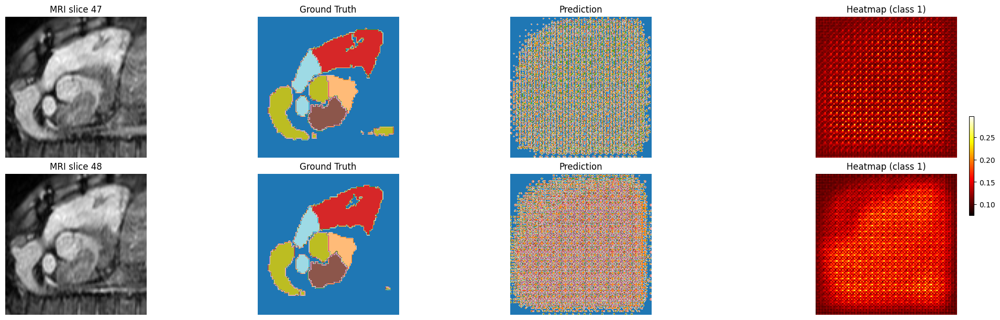

Mild Dice: 0.0367
Moderate Dice: 0.0383
Severe Dice: 0.0390
LR after scheduler step: 0.000500
----------
epoch 3/500
Current LR: 0.000500
epoch 3 average training loss: 1.0746
Epoch 3 Training Dice: 0.0337
----------
epoch 4/500
Current LR: 0.000500
epoch 4 average training loss: 1.0312
Epoch 4 Training Dice: 0.0404
Validation loss -> Mild: 1.1022, Moderate: 1.0937, Severe: 1.1144, Avg: 1.1035


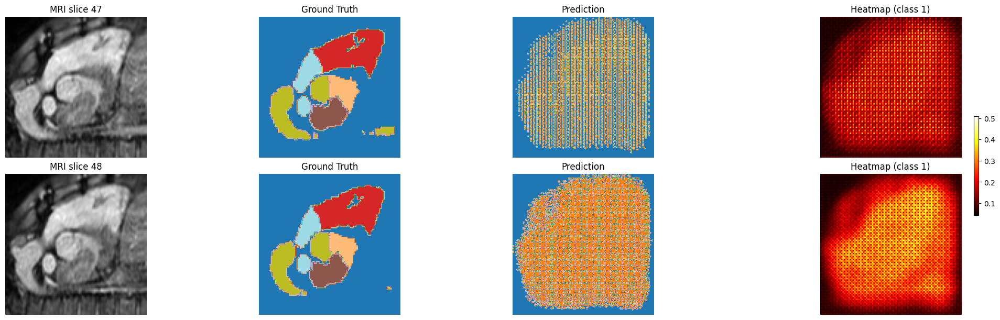

Mild Dice: 0.0327
Moderate Dice: 0.0458
Severe Dice: 0.0406
LR after scheduler step: 0.000500
----------
epoch 5/500
Current LR: 0.000500
epoch 5 average training loss: 0.9918
Epoch 5 Training Dice: 0.0329
----------
epoch 6/500
Current LR: 0.000500
epoch 6 average training loss: 0.9590
Epoch 6 Training Dice: 0.0565
Validation loss -> Mild: 1.0227, Moderate: 1.0164, Severe: 1.0199, Avg: 1.0197


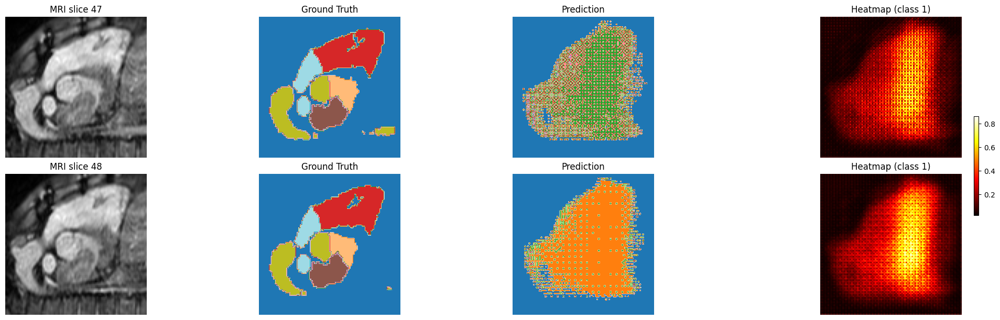

Mild Dice: 0.0537
Moderate Dice: 0.0603
Severe Dice: 0.0654
LR after scheduler step: 0.000500
----------
epoch 7/500
Current LR: 0.000500
epoch 7 average training loss: 0.9291
Epoch 7 Training Dice: 0.0793
----------
epoch 8/500
Current LR: 0.000500
epoch 8 average training loss: 0.9078
Epoch 8 Training Dice: 0.0542
Validation loss -> Mild: 0.9743, Moderate: 0.9720, Severe: 0.9629, Avg: 0.9697


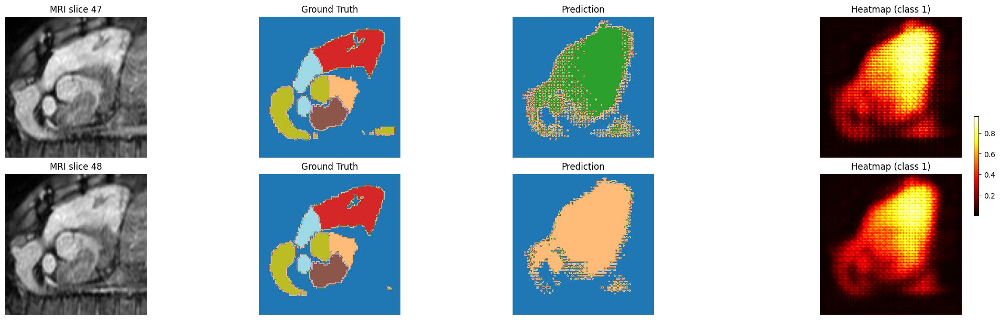

Mild Dice: 0.0550
Moderate Dice: 0.0539
Severe Dice: 0.0641
LR after scheduler step: 0.000500
----------
epoch 9/500
Current LR: 0.000500
epoch 9 average training loss: 0.8910
Epoch 9 Training Dice: 0.0433
----------
epoch 10/500
Current LR: 0.000500
epoch 10 average training loss: 0.8784
Epoch 10 Training Dice: 0.0858
Validation loss -> Mild: 0.9678, Moderate: 0.9070, Severe: 0.9339, Avg: 0.9362


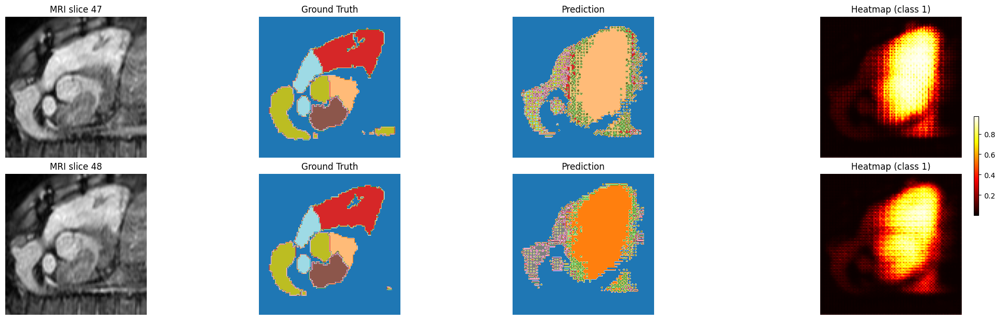

Mild Dice: 0.0703
Moderate Dice: 0.1013
Severe Dice: 0.1134
LR after scheduler step: 0.000500
----------
epoch 11/500
Current LR: 0.000500
epoch 11 average training loss: 0.8728
Epoch 11 Training Dice: 0.1144
----------
epoch 12/500
Current LR: 0.000500
epoch 12 average training loss: 0.8634
Epoch 12 Training Dice: 0.1458
Validation loss -> Mild: 0.9171, Moderate: 0.8646, Severe: 0.8606, Avg: 0.8808


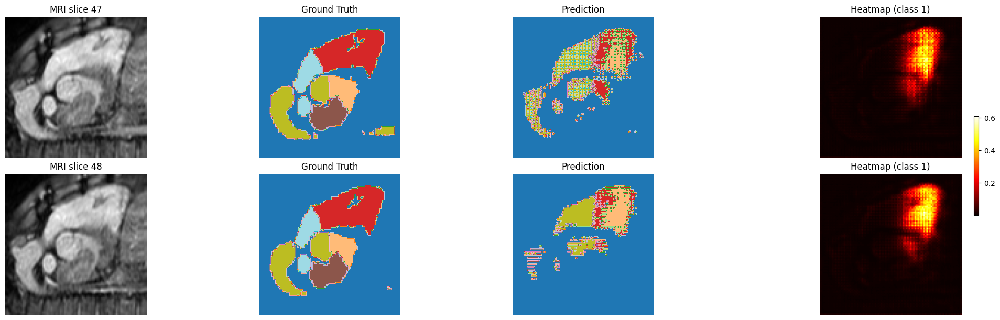

Mild Dice: 0.1134
Moderate Dice: 0.1487
Severe Dice: 0.1585
LR after scheduler step: 0.000500
----------
epoch 13/500
Current LR: 0.000500
epoch 13 average training loss: 0.8537
Epoch 13 Training Dice: 0.1364
----------
epoch 14/500
Current LR: 0.000500
epoch 14 average training loss: 0.8460
Epoch 14 Training Dice: 0.0742
Validation loss -> Mild: 0.9579, Moderate: 0.9179, Severe: 0.9281, Avg: 0.9346


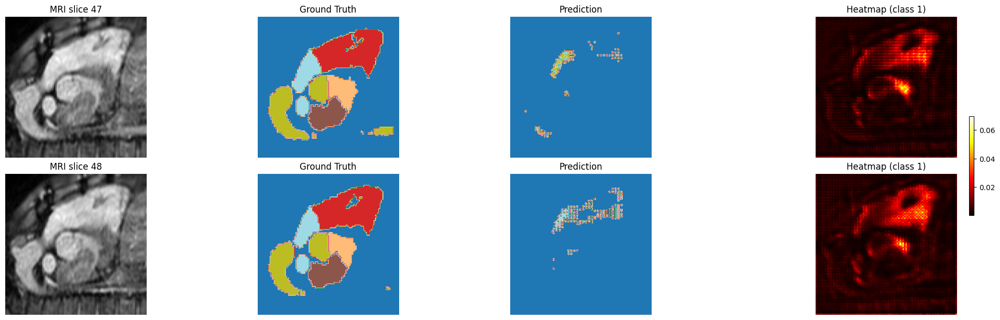

Mild Dice: 0.0526
Moderate Dice: 0.0805
Severe Dice: 0.0789
LR after scheduler step: 0.000500
----------
epoch 15/500
Current LR: 0.000500
epoch 15 average training loss: 0.8360
Epoch 15 Training Dice: 0.1527
----------
epoch 16/500
Current LR: 0.000500
epoch 16 average training loss: 0.8240
Epoch 16 Training Dice: 0.1491
Validation loss -> Mild: 0.9082, Moderate: 0.8758, Severe: 0.8870, Avg: 0.8903


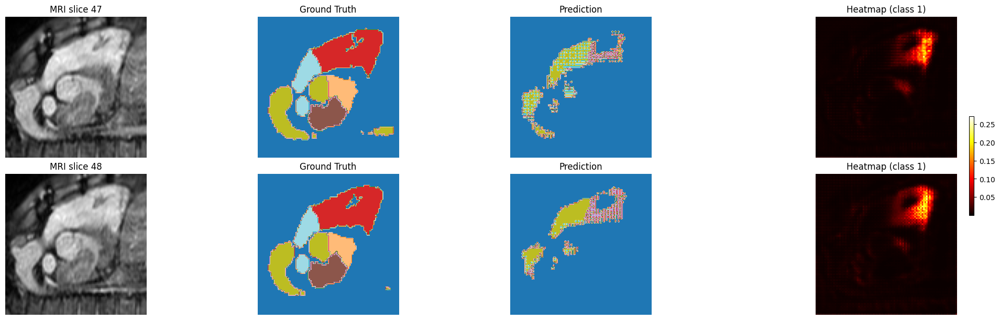

Mild Dice: 0.1169
Moderate Dice: 0.1406
Severe Dice: 0.1460
LR after scheduler step: 0.000500
----------
epoch 17/500
Current LR: 0.000500
epoch 17 average training loss: 0.8128
Epoch 17 Training Dice: 0.2076
----------
epoch 18/500
Current LR: 0.000500
epoch 18 average training loss: 0.8083
Epoch 18 Training Dice: 0.2241
Validation loss -> Mild: 0.8725, Moderate: 0.8175, Severe: 0.8375, Avg: 0.8425


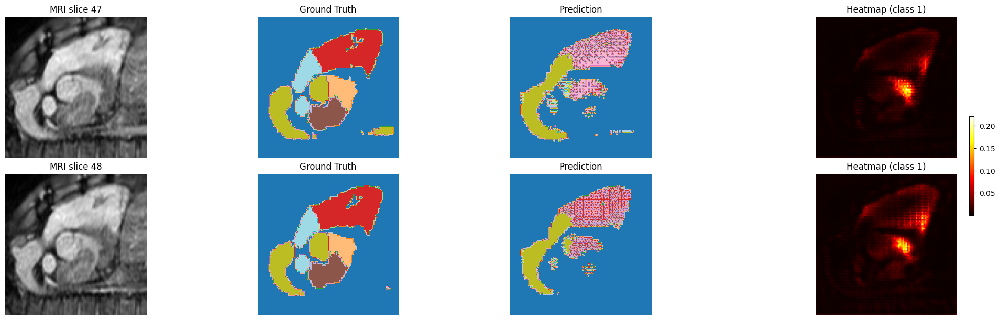

Mild Dice: 0.1885
Moderate Dice: 0.2194
Severe Dice: 0.2067
LR after scheduler step: 0.000500
----------
epoch 19/500
Current LR: 0.000500
epoch 19 average training loss: 0.8081
Epoch 19 Training Dice: 0.1561
----------
epoch 20/500
Current LR: 0.000500
epoch 20 average training loss: 0.7974
Epoch 20 Training Dice: 0.2339
Validation loss -> Mild: 0.8652, Moderate: 0.7838, Severe: 0.8075, Avg: 0.8189


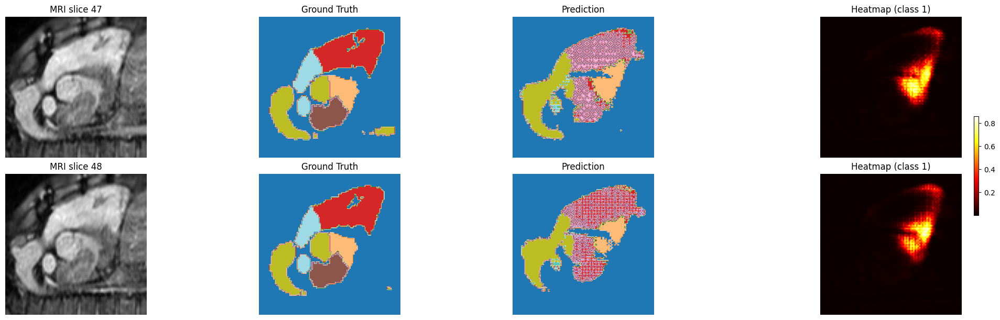

Mild Dice: 0.1926
Moderate Dice: 0.2538
Severe Dice: 0.2422
LR after scheduler step: 0.000500
----------
epoch 21/500
Current LR: 0.000500
epoch 21 average training loss: 0.7878
Epoch 21 Training Dice: 0.2087
----------
epoch 22/500
Current LR: 0.000500
epoch 22 average training loss: 0.7772
Epoch 22 Training Dice: 0.2399
Validation loss -> Mild: 0.8722, Moderate: 0.8162, Severe: 0.8313, Avg: 0.8399


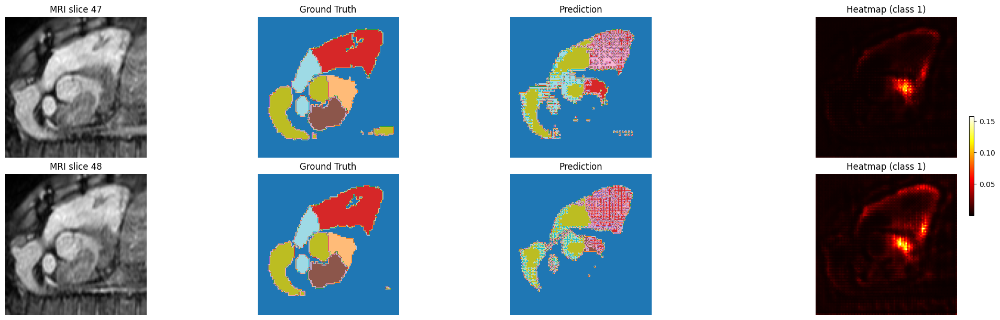

Mild Dice: 0.1838
Moderate Dice: 0.2250
Severe Dice: 0.2200
LR after scheduler step: 0.000500
----------
epoch 23/500
Current LR: 0.000500
epoch 23 average training loss: 0.7735
Epoch 23 Training Dice: 0.2681
----------
epoch 24/500
Current LR: 0.000500
epoch 24 average training loss: 0.7696
Epoch 24 Training Dice: 0.2080
Validation loss -> Mild: 0.9000, Moderate: 0.8103, Severe: 0.8444, Avg: 0.8516


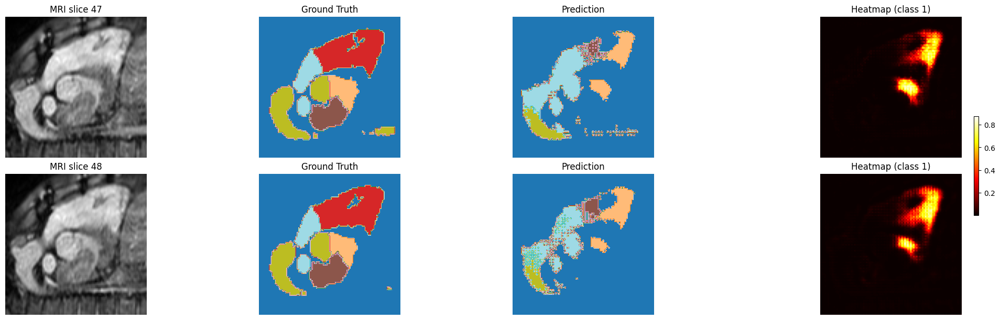

Mild Dice: 0.1450
Moderate Dice: 0.2250
Severe Dice: 0.1937
LR after scheduler step: 0.000500
----------
epoch 25/500
Current LR: 0.000500
epoch 25 average training loss: 0.7661
Epoch 25 Training Dice: 0.3090
----------
epoch 26/500
Current LR: 0.000500
epoch 26 average training loss: 0.7512
Epoch 26 Training Dice: 0.3209
Validation loss -> Mild: 0.8151, Moderate: 0.7366, Severe: 0.8003, Avg: 0.7840


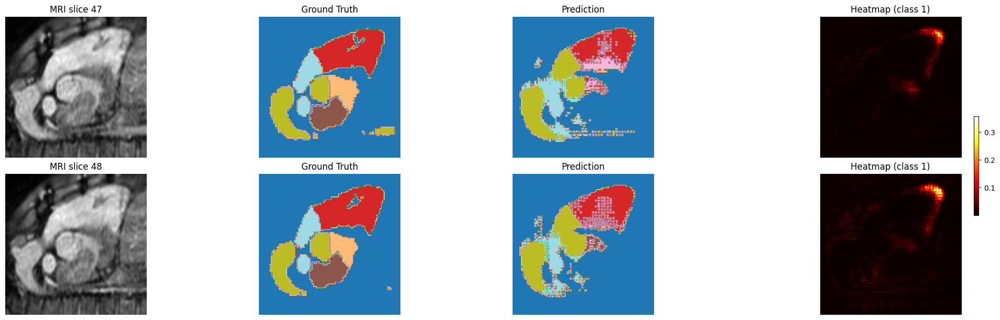

Mild Dice: 0.2750
Moderate Dice: 0.3604
Severe Dice: 0.2648
LR after scheduler step: 0.000500
----------
epoch 27/500
Current LR: 0.000500
epoch 27 average training loss: 0.7450
Epoch 27 Training Dice: 0.2846
----------
epoch 28/500
Current LR: 0.000500
epoch 28 average training loss: 0.7438
Epoch 28 Training Dice: 0.3555
Validation loss -> Mild: 0.7979, Moderate: 0.6986, Severe: 0.7697, Avg: 0.7554


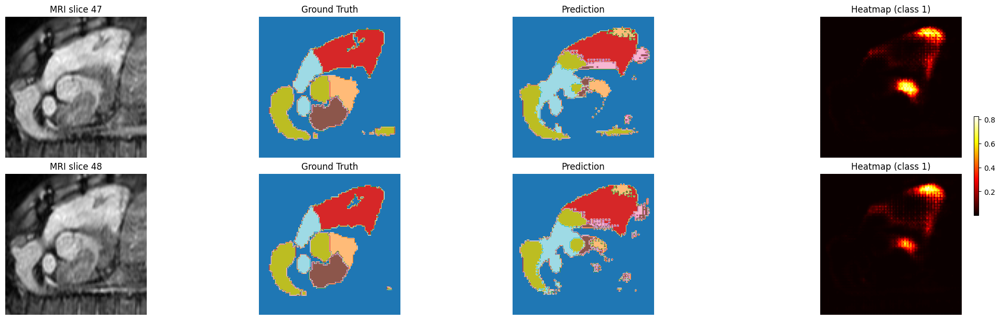

Mild Dice: 0.3057
Moderate Dice: 0.3909
Severe Dice: 0.2949
LR after scheduler step: 0.000500
----------
epoch 29/500
Current LR: 0.000500
epoch 29 average training loss: 0.7096
Epoch 29 Training Dice: 0.1894
----------
epoch 30/500
Current LR: 0.000500
epoch 30 average training loss: 0.7073
Epoch 30 Training Dice: 0.3010
Validation loss -> Mild: 0.8253, Moderate: 0.6879, Severe: 0.7615, Avg: 0.7582


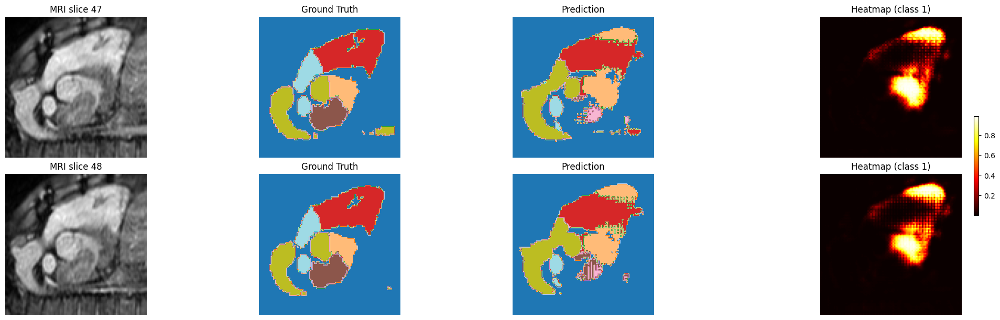

Mild Dice: 0.2730
Moderate Dice: 0.4010
Severe Dice: 0.3191
LR after scheduler step: 0.000500
----------
epoch 31/500
Current LR: 0.000500
epoch 31 average training loss: 0.7063
Epoch 31 Training Dice: 0.3432
----------
epoch 32/500
Current LR: 0.000500
epoch 32 average training loss: 0.7006
Epoch 32 Training Dice: 0.3467
Validation loss -> Mild: 0.8045, Moderate: 0.6980, Severe: 0.8137, Avg: 0.7720


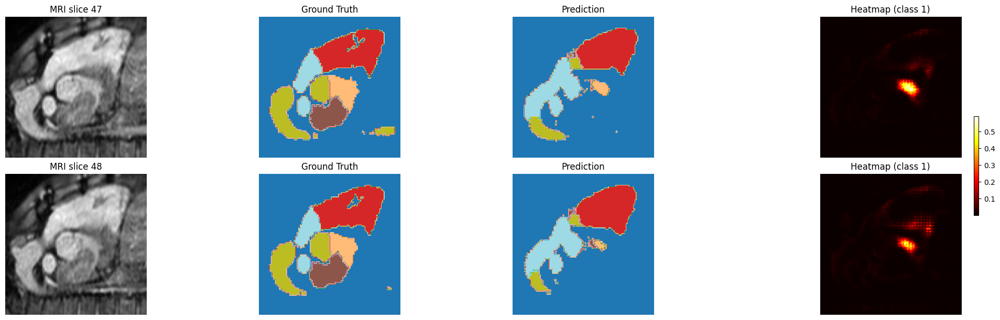

Mild Dice: 0.2715
Moderate Dice: 0.3791
Severe Dice: 0.2435
LR after scheduler step: 0.000500
----------
epoch 33/500
Current LR: 0.000500
epoch 33 average training loss: 0.6970
Epoch 33 Training Dice: 0.3611
----------
epoch 34/500
Current LR: 0.000500
epoch 34 average training loss: 0.6926
Epoch 34 Training Dice: 0.2914
Validation loss -> Mild: 0.8231, Moderate: 0.7040, Severe: 0.7793, Avg: 0.7688


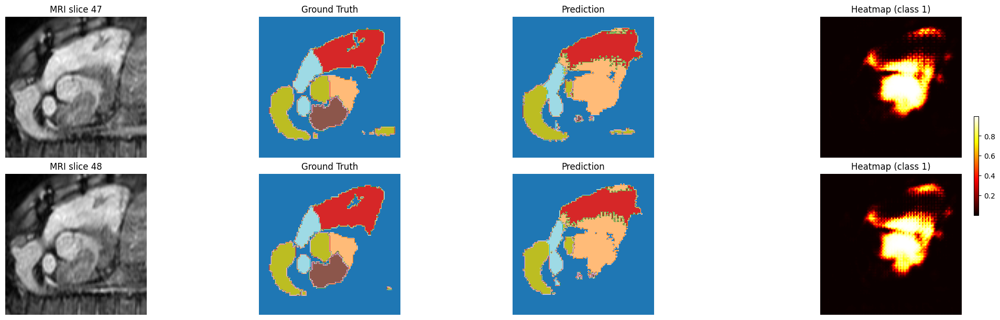

Mild Dice: 0.2654
Moderate Dice: 0.3864
Severe Dice: 0.3137
LR after scheduler step: 0.000500
----------
epoch 35/500
Current LR: 0.000500
epoch 35 average training loss: 0.6713
Epoch 35 Training Dice: 0.3738
----------
epoch 36/500
Current LR: 0.000500
epoch 36 average training loss: 0.6733
Epoch 36 Training Dice: 0.4307
Validation loss -> Mild: 0.7660, Moderate: 0.6460, Severe: 0.7441, Avg: 0.7187


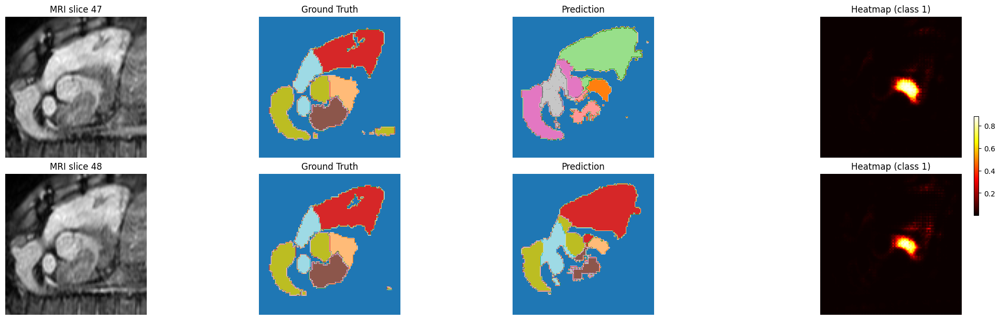

Mild Dice: 0.3511
Moderate Dice: 0.4522
Severe Dice: 0.3461
LR after scheduler step: 0.000500
----------
epoch 37/500
Current LR: 0.000500
epoch 37 average training loss: 0.6558
Epoch 37 Training Dice: 0.3327
----------
epoch 38/500
Current LR: 0.000500
epoch 38 average training loss: 0.6600
Epoch 38 Training Dice: 0.4277
Validation loss -> Mild: 0.7376, Moderate: 0.6811, Severe: 0.7557, Avg: 0.7248


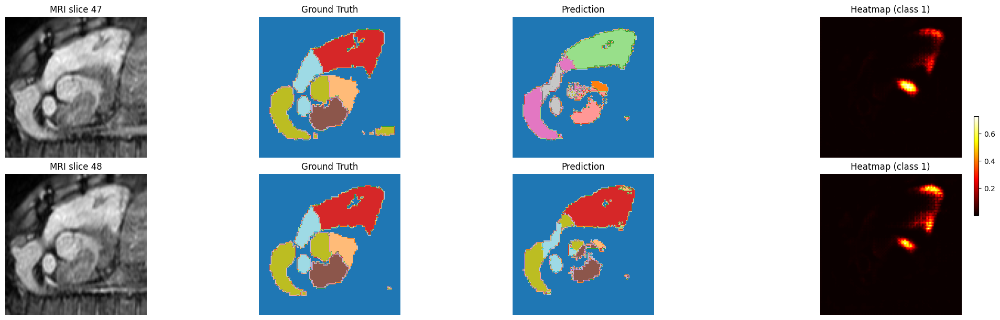

Mild Dice: 0.3710
Moderate Dice: 0.4200
Severe Dice: 0.3332
LR after scheduler step: 0.000500
----------
epoch 39/500
Current LR: 0.000500
epoch 39 average training loss: 0.6376
Epoch 39 Training Dice: 0.4393
----------
epoch 40/500
Current LR: 0.000500
epoch 40 average training loss: 0.6215
Epoch 40 Training Dice: 0.4912
Validation loss -> Mild: 0.7176, Moderate: 0.5862, Severe: 0.7009, Avg: 0.6683


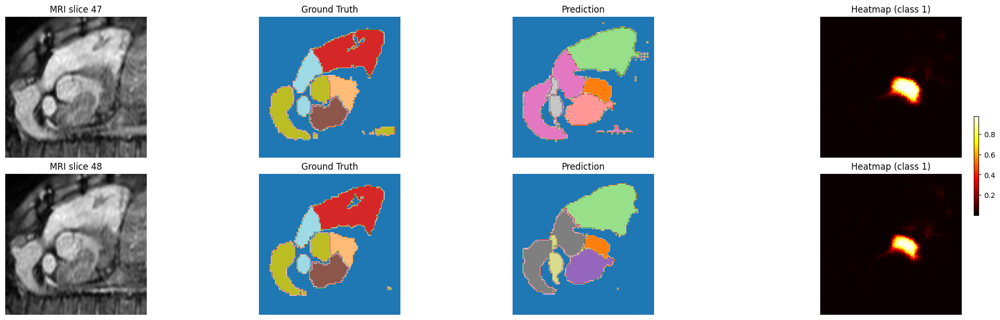

Mild Dice: 0.3935
Moderate Dice: 0.5234
Severe Dice: 0.4042
LR after scheduler step: 0.000500
----------
epoch 41/500
Current LR: 0.000500
epoch 41 average training loss: 0.6152
Epoch 41 Training Dice: 0.4753
----------
epoch 42/500
Current LR: 0.000500
epoch 42 average training loss: 0.5981
Epoch 42 Training Dice: 0.5021
Validation loss -> Mild: 0.6929, Moderate: 0.5635, Severe: 0.6768, Avg: 0.6444


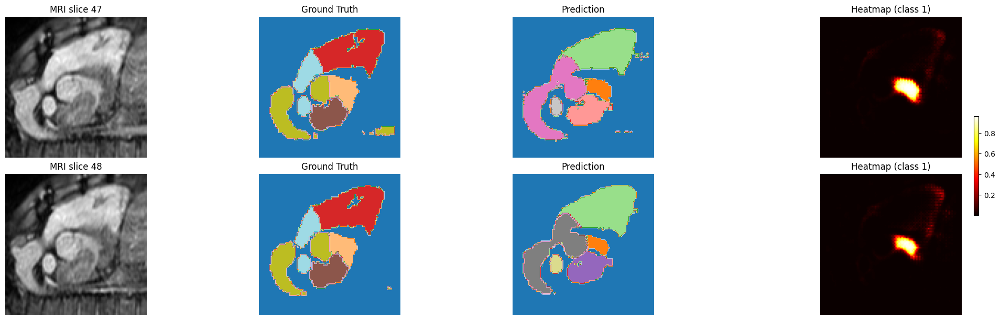

Mild Dice: 0.4177
Moderate Dice: 0.5464
Severe Dice: 0.4287
LR after scheduler step: 0.000500
----------
epoch 43/500
Current LR: 0.000500
epoch 43 average training loss: 0.5982
Epoch 43 Training Dice: 0.5201
----------
epoch 44/500
Current LR: 0.000500
epoch 44 average training loss: 0.5892
Epoch 44 Training Dice: 0.5179
Validation loss -> Mild: 0.6872, Moderate: 0.5590, Severe: 0.7013, Avg: 0.6492


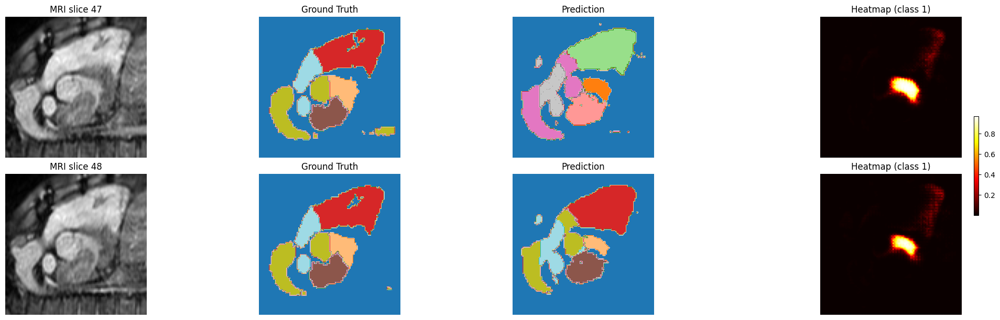

Mild Dice: 0.4224
Moderate Dice: 0.5484
Severe Dice: 0.3942
LR after scheduler step: 0.000500
----------
epoch 45/500
Current LR: 0.000500
epoch 45 average training loss: 0.5911
Epoch 45 Training Dice: 0.5156
----------
epoch 46/500
Current LR: 0.000500
epoch 46 average training loss: 0.5740
Epoch 46 Training Dice: 0.4553
Validation loss -> Mild: 0.7440, Moderate: 0.6119, Severe: 0.7284, Avg: 0.6948


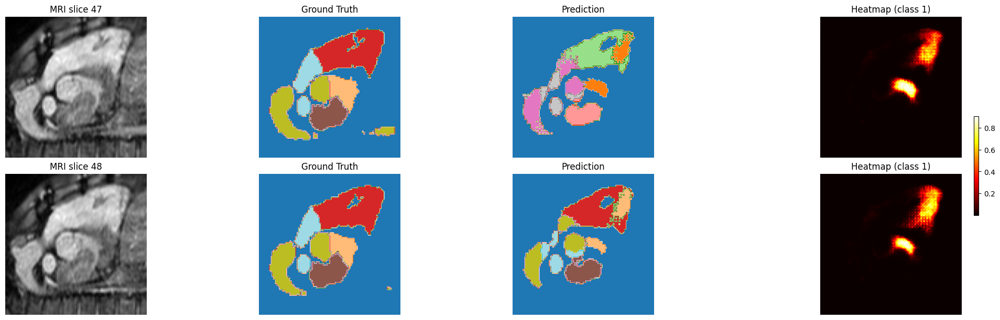

Mild Dice: 0.3717
Moderate Dice: 0.4934
Severe Dice: 0.3689
LR after scheduler step: 0.000500
----------
epoch 47/500
Current LR: 0.000500
epoch 47 average training loss: 0.5818
Epoch 47 Training Dice: 0.5191
----------
epoch 48/500
Current LR: 0.000500
epoch 48 average training loss: 0.5677
Epoch 48 Training Dice: 0.5060
Validation loss -> Mild: 0.7251, Moderate: 0.6164, Severe: 0.7126, Avg: 0.6847


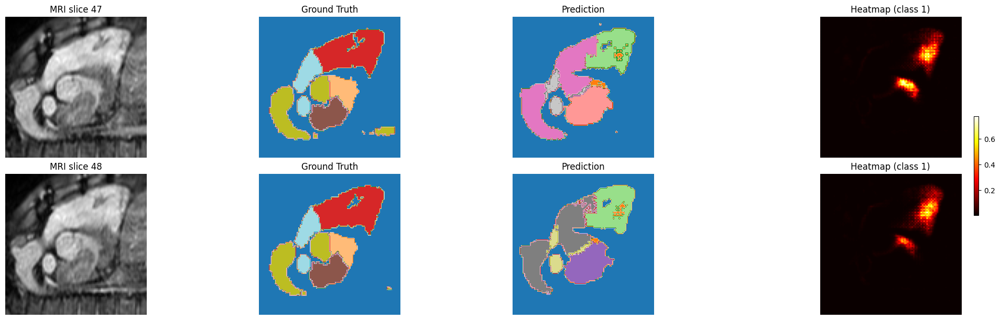

Mild Dice: 0.3977
Moderate Dice: 0.4919
Severe Dice: 0.3887
LR after scheduler step: 0.000500
----------
epoch 49/500
Current LR: 0.000500
epoch 49 average training loss: 0.5728
Epoch 49 Training Dice: 0.5279
----------
epoch 50/500
Current LR: 0.000500
epoch 50 average training loss: 0.5722
Epoch 50 Training Dice: 0.5431
Validation loss -> Mild: 0.7317, Moderate: 0.5768, Severe: 0.7336, Avg: 0.6807


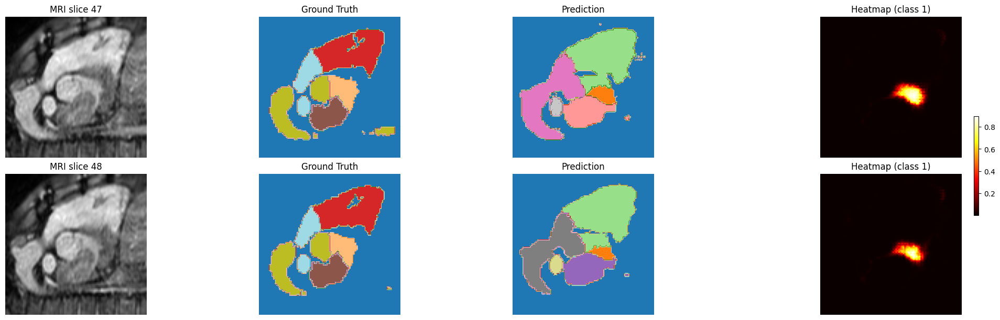

Mild Dice: 0.4045
Moderate Dice: 0.5515
Severe Dice: 0.4094
LR after scheduler step: 0.000500
----------
epoch 51/500
Current LR: 0.000500
epoch 51 average training loss: 0.5642
Epoch 51 Training Dice: 0.5632
----------
epoch 52/500
Current LR: 0.000500
epoch 52 average training loss: 0.5583
Epoch 52 Training Dice: 0.5996
Validation loss -> Mild: 0.6730, Moderate: 0.5341, Severe: 0.6381, Avg: 0.6150


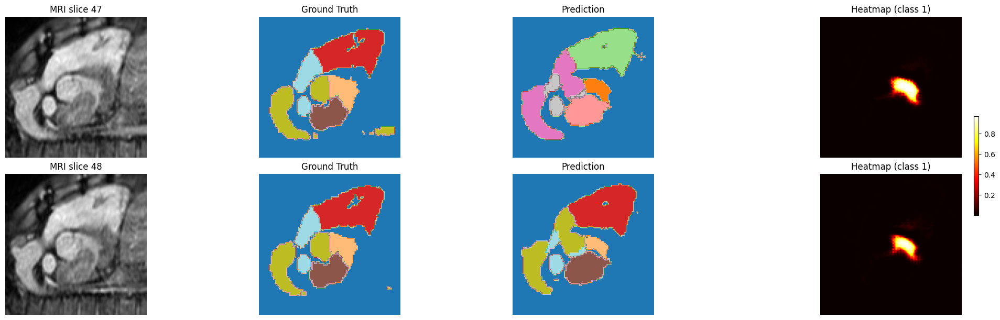

Mild Dice: 0.4697
Moderate Dice: 0.5986
Severe Dice: 0.4993
LR after scheduler step: 0.000500
----------
epoch 53/500
Current LR: 0.000500
epoch 53 average training loss: 0.5431
Epoch 53 Training Dice: 0.5234
----------
epoch 54/500
Current LR: 0.000500
epoch 54 average training loss: 0.5335
Epoch 54 Training Dice: 0.5526
Validation loss -> Mild: 0.7134, Moderate: 0.5960, Severe: 0.6566, Avg: 0.6554


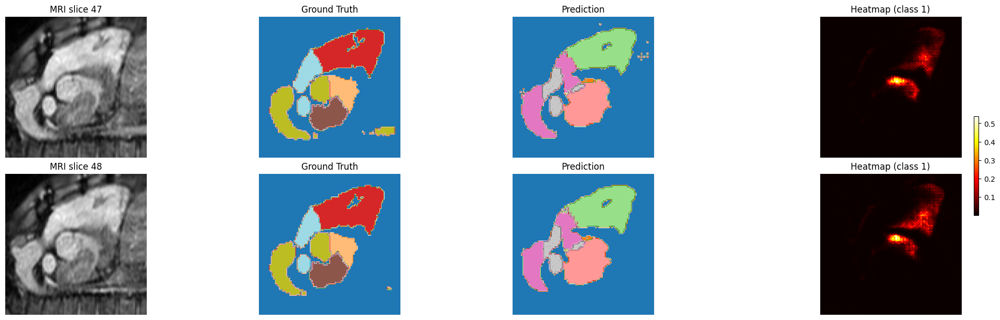

Mild Dice: 0.4281
Moderate Dice: 0.5342
Severe Dice: 0.5006
LR after scheduler step: 0.000500
----------
epoch 55/500
Current LR: 0.000500
epoch 55 average training loss: 0.5254
Epoch 55 Training Dice: 0.6131
----------
epoch 56/500
Current LR: 0.000500
epoch 56 average training loss: 0.5269
Epoch 56 Training Dice: 0.5906
Validation loss -> Mild: 0.7099, Moderate: 0.5184, Severe: 0.6482, Avg: 0.6255


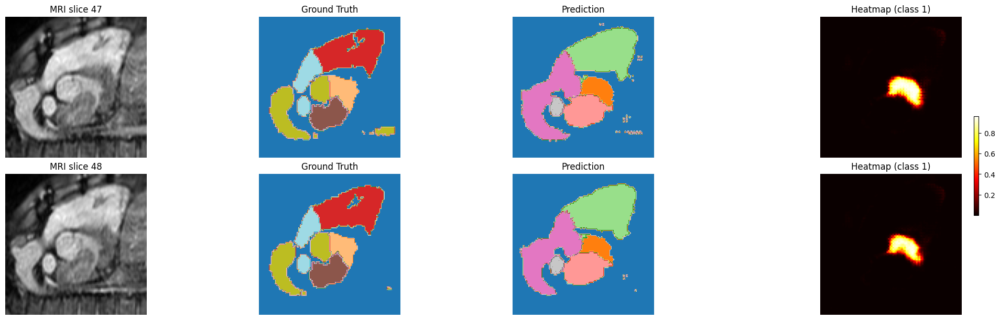

Mild Dice: 0.4465
Moderate Dice: 0.6355
Severe Dice: 0.5087
LR after scheduler step: 0.000500
----------
epoch 57/500
Current LR: 0.000500
epoch 57 average training loss: 0.5132
Epoch 57 Training Dice: 0.6371
----------
epoch 58/500
Current LR: 0.000500
epoch 58 average training loss: 0.5110
Epoch 58 Training Dice: 0.6325
Validation loss -> Mild: 0.6646, Moderate: 0.5244, Severe: 0.5920, Avg: 0.5937


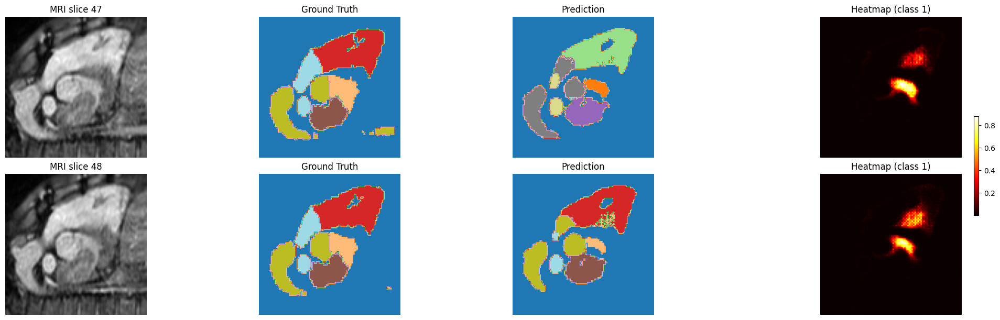

Mild Dice: 0.4815
Moderate Dice: 0.6236
Severe Dice: 0.5729
LR after scheduler step: 0.000500
----------
epoch 59/500
Current LR: 0.000500
epoch 59 average training loss: 0.4904
Epoch 59 Training Dice: 0.6846
----------
epoch 60/500
Current LR: 0.000500
epoch 60 average training loss: 0.4941
Epoch 60 Training Dice: 0.6421
Validation loss -> Mild: 0.6609, Moderate: 0.5018, Severe: 0.6384, Avg: 0.6004


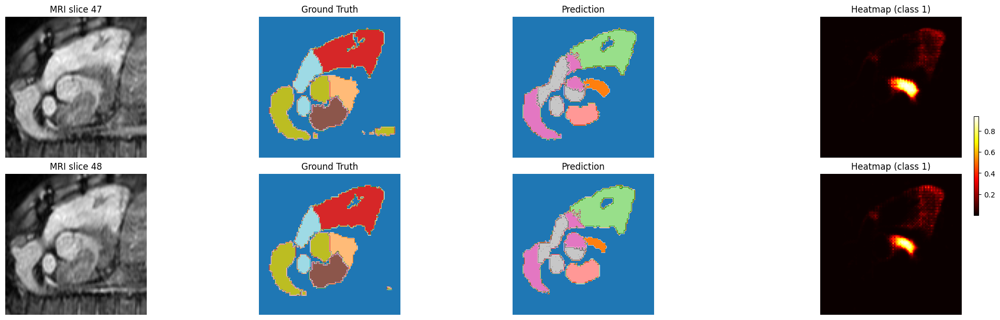

Mild Dice: 0.4920
Moderate Dice: 0.6568
Severe Dice: 0.5068
LR after scheduler step: 0.000500
----------
epoch 61/500
Current LR: 0.000500
epoch 61 average training loss: 0.4784
Epoch 61 Training Dice: 0.6783
----------
epoch 62/500
Current LR: 0.000500
epoch 62 average training loss: 0.4716
Epoch 62 Training Dice: 0.6443
Validation loss -> Mild: 0.6701, Moderate: 0.5288, Severe: 0.6482, Avg: 0.6157


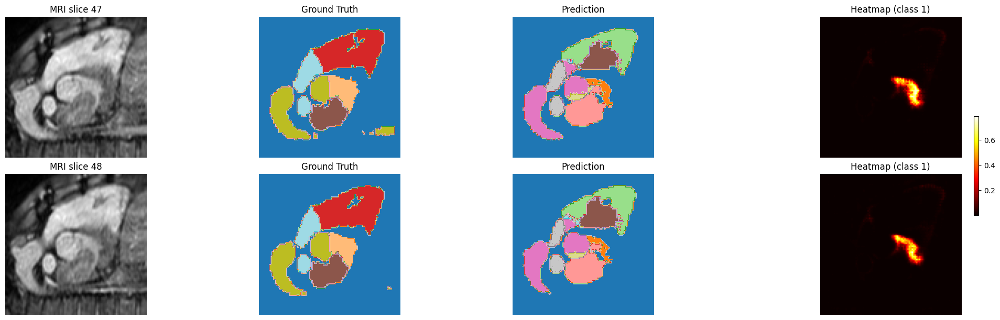

Mild Dice: 0.4844
Moderate Dice: 0.6319
Severe Dice: 0.5289
LR after scheduler step: 0.000500
----------
epoch 63/500
Current LR: 0.000500
epoch 63 average training loss: 0.4665
Epoch 63 Training Dice: 0.6688
----------
epoch 64/500
Current LR: 0.000500
epoch 64 average training loss: 0.4427
Epoch 64 Training Dice: 0.7090
Validation loss -> Mild: 0.6361, Moderate: 0.4514, Severe: 0.5813, Avg: 0.5563


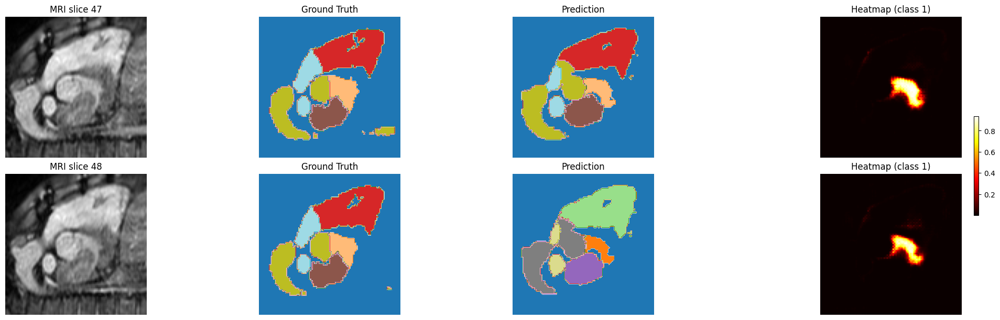

Mild Dice: 0.5267
Moderate Dice: 0.7100
Severe Dice: 0.5898
LR after scheduler step: 0.000500
----------
epoch 65/500
Current LR: 0.000500
epoch 65 average training loss: 0.4530
Epoch 65 Training Dice: 0.6787
----------
epoch 66/500
Current LR: 0.000500
epoch 66 average training loss: 0.4395
Epoch 66 Training Dice: 0.7247
Validation loss -> Mild: 0.6190, Moderate: 0.4367, Severe: 0.5502, Avg: 0.5353


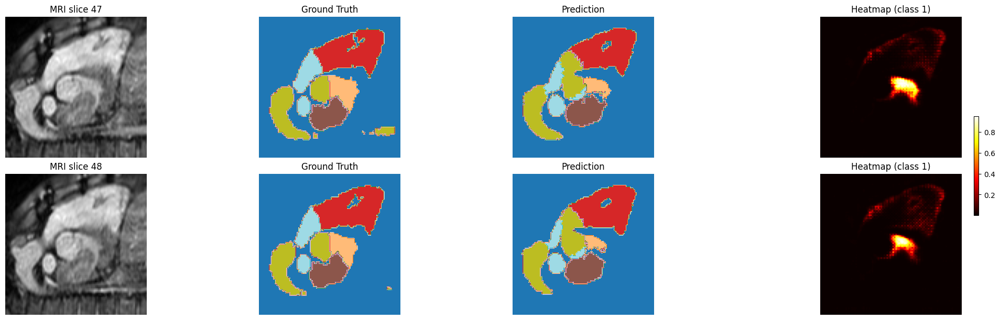

Mild Dice: 0.5332
Moderate Dice: 0.7195
Severe Dice: 0.6138
LR after scheduler step: 0.000500
----------
epoch 67/500
Current LR: 0.000500
epoch 67 average training loss: 0.4344
Epoch 67 Training Dice: 0.7302
----------
epoch 68/500
Current LR: 0.000500
epoch 68 average training loss: 0.4239
Epoch 68 Training Dice: 0.7251
Validation loss -> Mild: 0.6018, Moderate: 0.4234, Severe: 0.5808, Avg: 0.5353


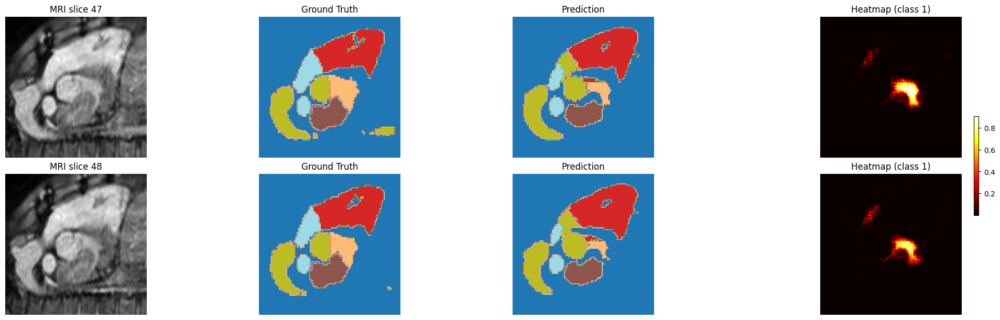

Mild Dice: 0.5583
Moderate Dice: 0.7346
Severe Dice: 0.5930
LR after scheduler step: 0.000500
----------
epoch 69/500
Current LR: 0.000500
epoch 69 average training loss: 0.4285
Epoch 69 Training Dice: 0.6754
----------
epoch 70/500
Current LR: 0.000500
epoch 70 average training loss: 0.4228
Epoch 70 Training Dice: 0.7484
Validation loss -> Mild: 0.6074, Moderate: 0.4203, Severe: 0.5443, Avg: 0.5240


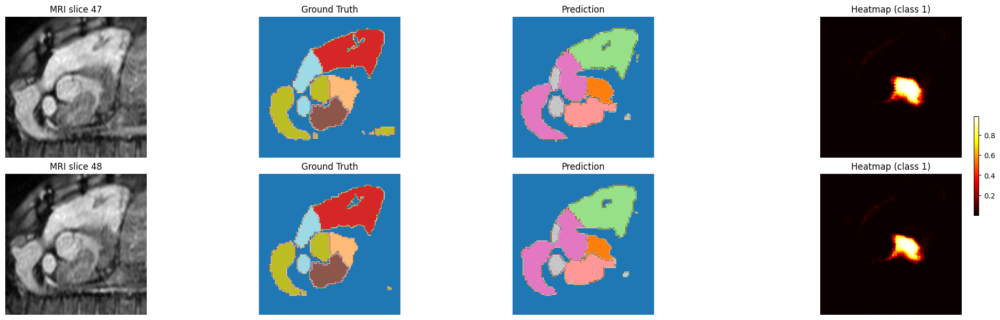

Mild Dice: 0.5489
Moderate Dice: 0.7357
Severe Dice: 0.6300
LR after scheduler step: 0.000500
----------
epoch 71/500
Current LR: 0.000500
epoch 71 average training loss: 0.4189
Epoch 71 Training Dice: 0.7113
----------
epoch 72/500
Current LR: 0.000500
epoch 72 average training loss: 0.4277
Epoch 72 Training Dice: 0.7217
Validation loss -> Mild: 0.6219, Moderate: 0.4360, Severe: 0.5535, Avg: 0.5371


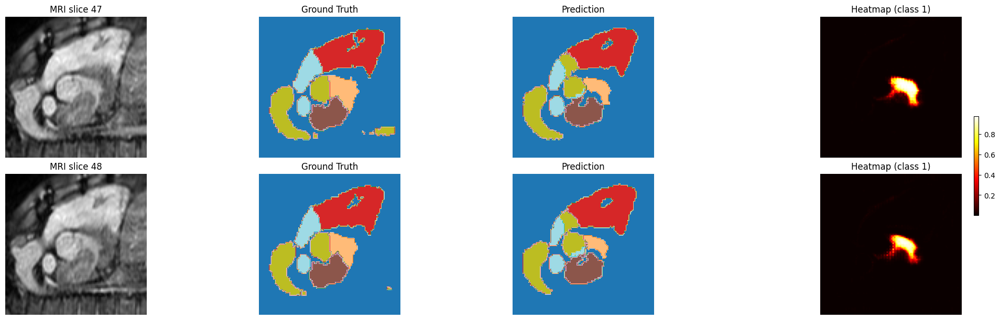

Mild Dice: 0.5247
Moderate Dice: 0.7207
Severe Dice: 0.6048
LR after scheduler step: 0.000500
----------
epoch 73/500
Current LR: 0.000500
epoch 73 average training loss: 0.4122
Epoch 73 Training Dice: 0.7391
----------
epoch 74/500
Current LR: 0.000500
epoch 74 average training loss: 0.4131
Epoch 74 Training Dice: 0.7379
Validation loss -> Mild: 0.6102, Moderate: 0.4013, Severe: 0.5548, Avg: 0.5221


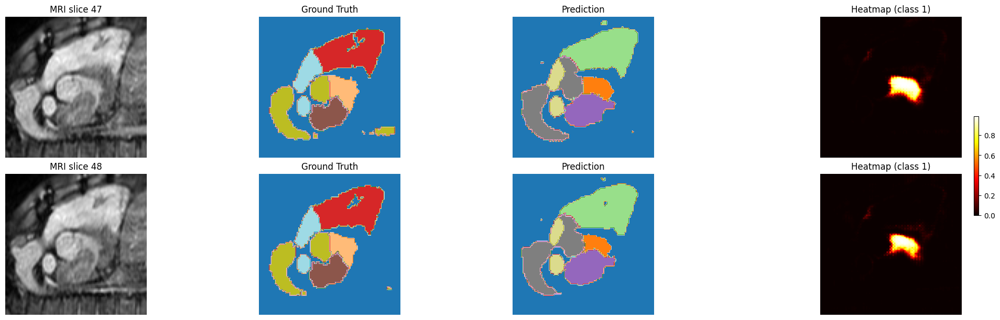

Mild Dice: 0.5419
Moderate Dice: 0.7650
Severe Dice: 0.6203
LR after scheduler step: 0.000500
----------
epoch 75/500
Current LR: 0.000500
epoch 75 average training loss: 0.4238
Epoch 75 Training Dice: 0.7211
----------
epoch 76/500
Current LR: 0.000500
epoch 76 average training loss: 0.4142
Epoch 76 Training Dice: 0.7280
Validation loss -> Mild: 0.6237, Moderate: 0.4229, Severe: 0.5320, Avg: 0.5262


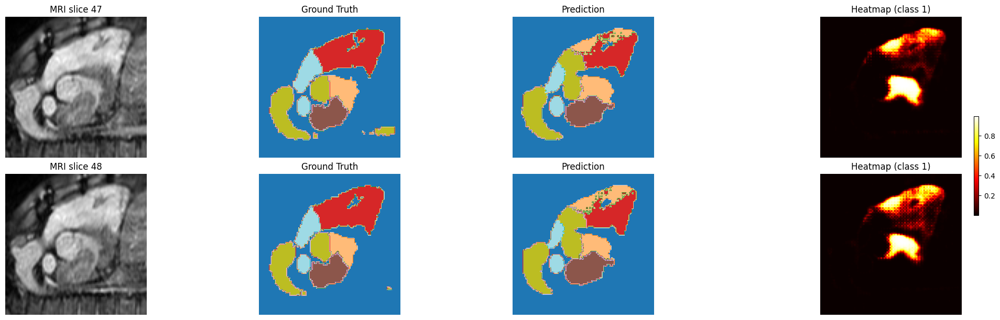

Mild Dice: 0.5293
Moderate Dice: 0.7313
Severe Dice: 0.6324
LR after scheduler step: 0.000500
----------
epoch 77/500
Current LR: 0.000500
epoch 77 average training loss: 0.4037
Epoch 77 Training Dice: 0.7390
----------
epoch 78/500
Current LR: 0.000500
epoch 78 average training loss: 0.4059
Epoch 78 Training Dice: 0.7658
Validation loss -> Mild: 0.5973, Moderate: 0.3989, Severe: 0.5396, Avg: 0.5119


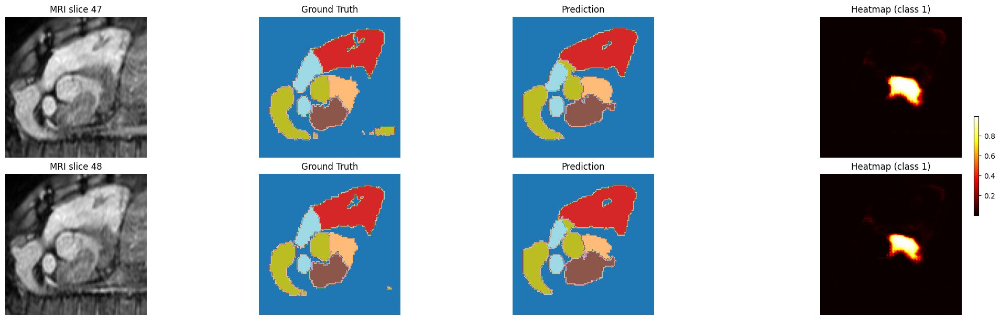

Mild Dice: 0.5584
Moderate Dice: 0.7604
Severe Dice: 0.6208
LR after scheduler step: 0.000500
----------
epoch 79/500
Current LR: 0.000500
epoch 79 average training loss: 0.3987
Epoch 79 Training Dice: 0.7570
----------
epoch 80/500
Current LR: 0.000500
epoch 80 average training loss: 0.3972
Epoch 80 Training Dice: 0.7652
Validation loss -> Mild: 0.6058, Moderate: 0.4051, Severe: 0.5368, Avg: 0.5159


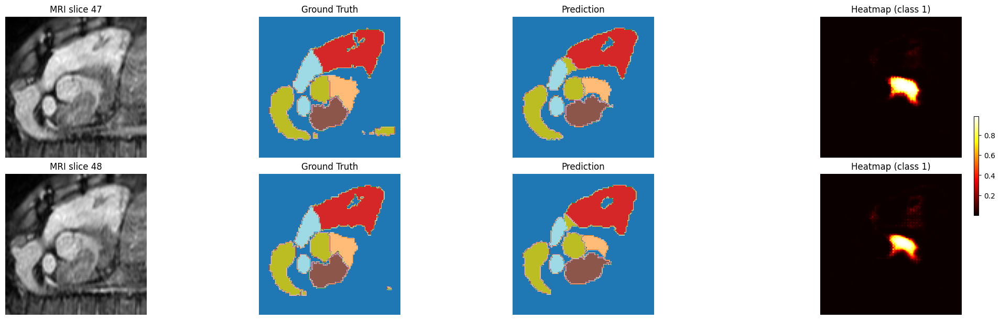

Mild Dice: 0.5459
Moderate Dice: 0.7477
Severe Dice: 0.6277
LR after scheduler step: 0.000500
----------
epoch 81/500
Current LR: 0.000500
epoch 81 average training loss: 0.4092
Epoch 81 Training Dice: 0.7741
----------
epoch 82/500
Current LR: 0.000500
epoch 82 average training loss: 0.4042
Epoch 82 Training Dice: 0.7614
Validation loss -> Mild: 0.5946, Moderate: 0.3984, Severe: 0.5193, Avg: 0.5041


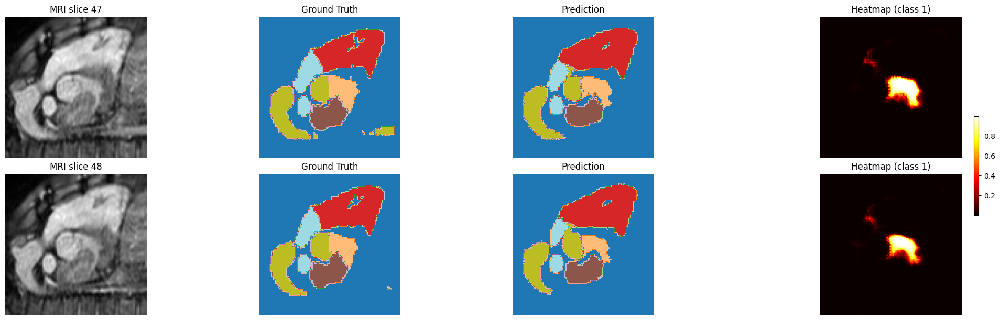

Mild Dice: 0.5644
Moderate Dice: 0.7592
Severe Dice: 0.6593
LR after scheduler step: 0.000500
----------
epoch 83/500
Current LR: 0.000500
epoch 83 average training loss: 0.3937
Epoch 83 Training Dice: 0.7313
----------
epoch 84/500
Current LR: 0.000500
epoch 84 average training loss: 0.3958
Epoch 84 Training Dice: 0.7780
Validation loss -> Mild: 0.5730, Moderate: 0.3837, Severe: 0.5383, Avg: 0.4983


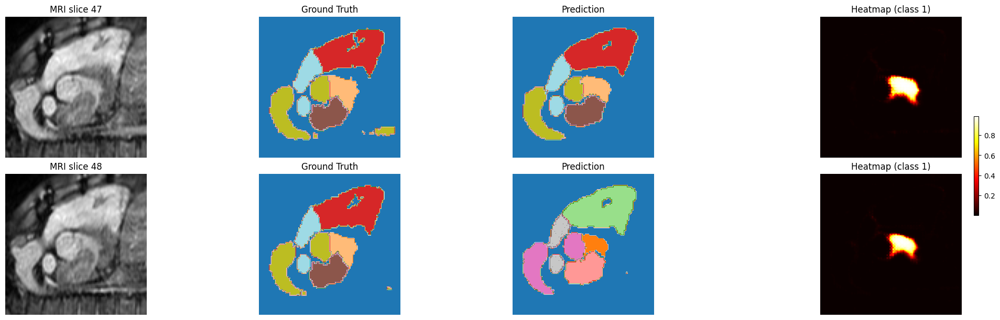

Mild Dice: 0.5684
Moderate Dice: 0.7730
Severe Dice: 0.6345
LR after scheduler step: 0.000500
----------
epoch 85/500
Current LR: 0.000500
epoch 85 average training loss: 0.3922
Epoch 85 Training Dice: 0.7794
----------
epoch 86/500
Current LR: 0.000500
epoch 86 average training loss: 0.3839
Epoch 86 Training Dice: 0.7510
Validation loss -> Mild: 0.6117, Moderate: 0.4029, Severe: 0.5372, Avg: 0.5173


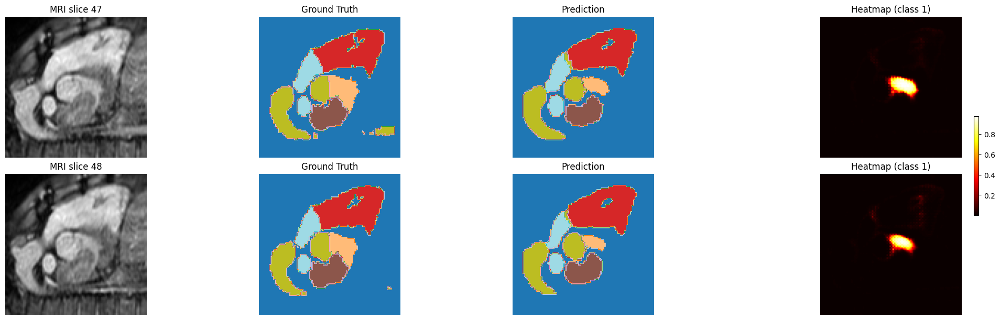

Mild Dice: 0.5377
Moderate Dice: 0.7499
Severe Dice: 0.6201
LR after scheduler step: 0.000500
----------
epoch 87/500
Current LR: 0.000500
epoch 87 average training loss: 0.3922
Epoch 87 Training Dice: 0.7645
----------
epoch 88/500
Current LR: 0.000500
epoch 88 average training loss: 0.3813
Epoch 88 Training Dice: 0.7757
Validation loss -> Mild: 0.5960, Moderate: 0.3903, Severe: 0.5349, Avg: 0.5070


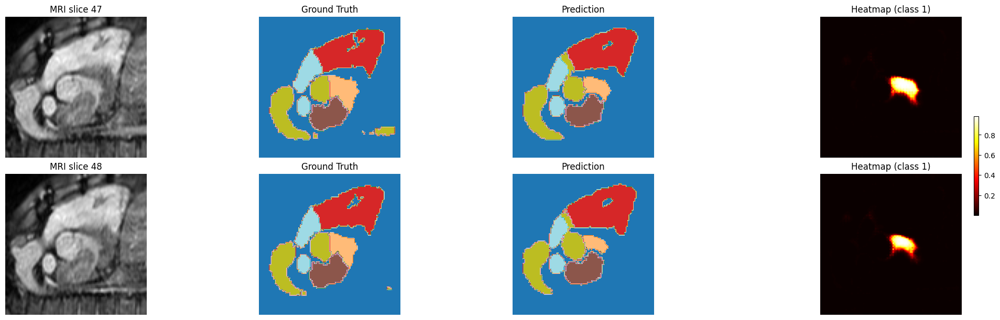

Mild Dice: 0.5574
Moderate Dice: 0.7672
Severe Dice: 0.6338
LR after scheduler step: 0.000500
----------
epoch 89/500
Current LR: 0.000500
epoch 89 average training loss: 0.3719
Epoch 89 Training Dice: 0.8003
----------
epoch 90/500
Current LR: 0.000500
epoch 90 average training loss: 0.3847
Epoch 90 Training Dice: 0.7965
Validation loss -> Mild: 0.5780, Moderate: 0.3776, Severe: 0.5329, Avg: 0.4962


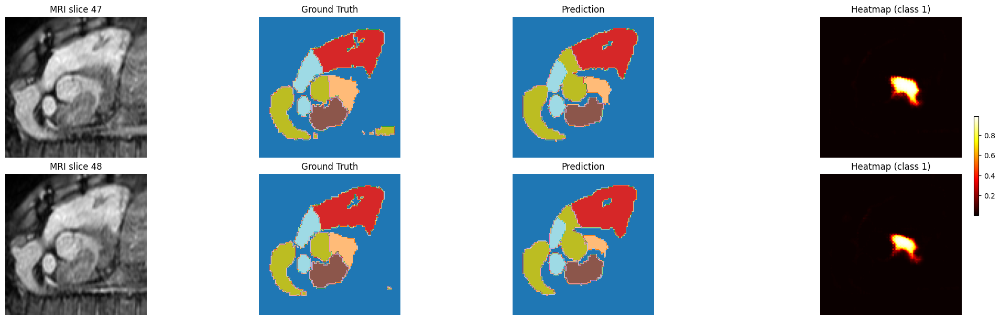

Mild Dice: 0.5755
Moderate Dice: 0.7810
Severe Dice: 0.6342
LR after scheduler step: 0.000500
----------
epoch 91/500
Current LR: 0.000500
epoch 91 average training loss: 0.3773
Epoch 91 Training Dice: 0.8018
----------
epoch 92/500
Current LR: 0.000500
epoch 92 average training loss: 0.3686
Epoch 92 Training Dice: 0.7933
Validation loss -> Mild: 0.5789, Moderate: 0.3858, Severe: 0.5495, Avg: 0.5047


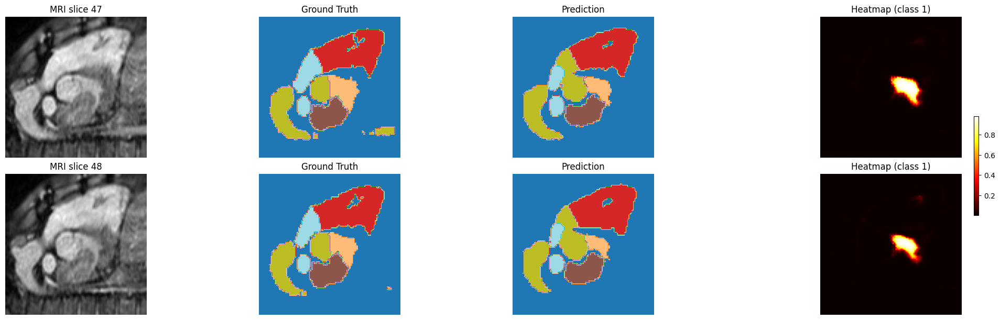

Mild Dice: 0.5720
Moderate Dice: 0.7666
Severe Dice: 0.6123
LR after scheduler step: 0.000500
----------
epoch 93/500
Current LR: 0.000500
epoch 93 average training loss: 0.3723
Epoch 93 Training Dice: 0.7936
----------
epoch 94/500
Current LR: 0.000500
epoch 94 average training loss: 0.3749
Epoch 94 Training Dice: 0.7608
Validation loss -> Mild: 0.5924, Moderate: 0.3949, Severe: 0.5570, Avg: 0.5148


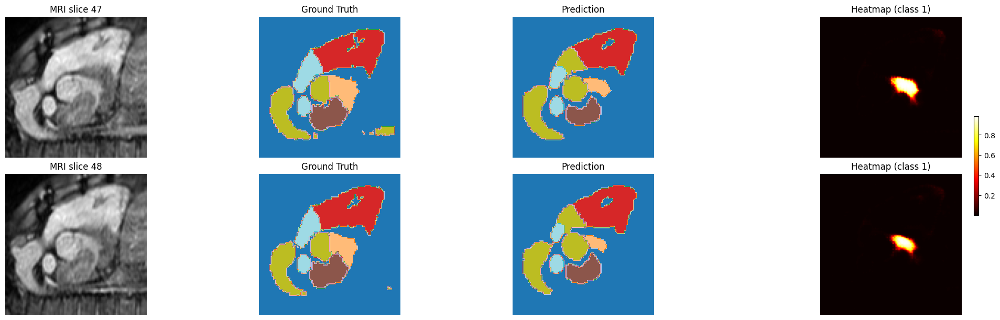

Mild Dice: 0.5477
Moderate Dice: 0.7571
Severe Dice: 0.5959
LR after scheduler step: 0.000500
----------
epoch 95/500
Current LR: 0.000500
epoch 95 average training loss: 0.3680
Epoch 95 Training Dice: 0.8056
----------
epoch 96/500
Current LR: 0.000500
epoch 96 average training loss: 0.3622
Epoch 96 Training Dice: 0.7970
Validation loss -> Mild: 0.5799, Moderate: 0.3627, Severe: 0.5190, Avg: 0.4872


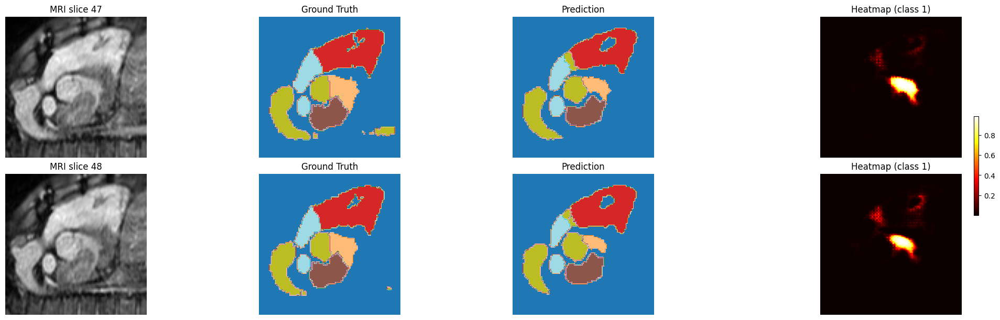

Mild Dice: 0.5756
Moderate Dice: 0.7961
Severe Dice: 0.6431
LR after scheduler step: 0.000500
----------
epoch 97/500
Current LR: 0.000500
epoch 97 average training loss: 0.3603
Epoch 97 Training Dice: 0.7887
----------
epoch 98/500
Current LR: 0.000500
epoch 98 average training loss: 0.3626
Epoch 98 Training Dice: 0.8072
Validation loss -> Mild: 0.5796, Moderate: 0.3669, Severe: 0.5197, Avg: 0.4888


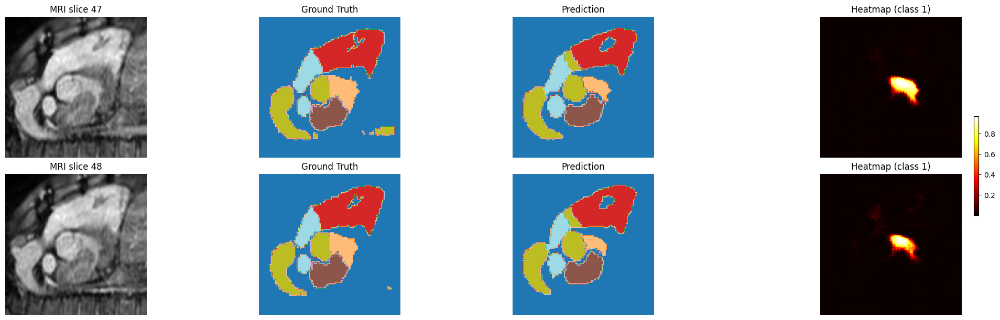

Mild Dice: 0.5742
Moderate Dice: 0.7908
Severe Dice: 0.6442
LR after scheduler step: 0.000500
----------
epoch 99/500
Current LR: 0.000500
epoch 99 average training loss: 0.3561
Epoch 99 Training Dice: 0.8052
----------
epoch 100/500
Current LR: 0.000500
epoch 100 average training loss: 0.3626
Epoch 100 Training Dice: 0.8118
Validation loss -> Mild: 0.5658, Moderate: 0.3726, Severe: 0.4910, Avg: 0.4764


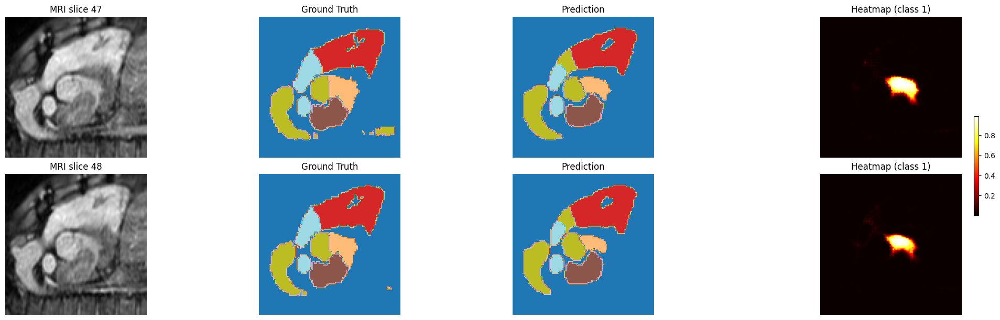

Mild Dice: 0.5888
Moderate Dice: 0.7809
Severe Dice: 0.6810
LR after scheduler step: 0.000500
----------
epoch 101/500
Current LR: 0.000500
epoch 101 average training loss: 0.3531
Epoch 101 Training Dice: 0.8122
----------
epoch 102/500
Current LR: 0.000500
epoch 102 average training loss: 0.3486
Epoch 102 Training Dice: 0.8201
Validation loss -> Mild: 0.5619, Moderate: 0.3597, Severe: 0.5099, Avg: 0.4772


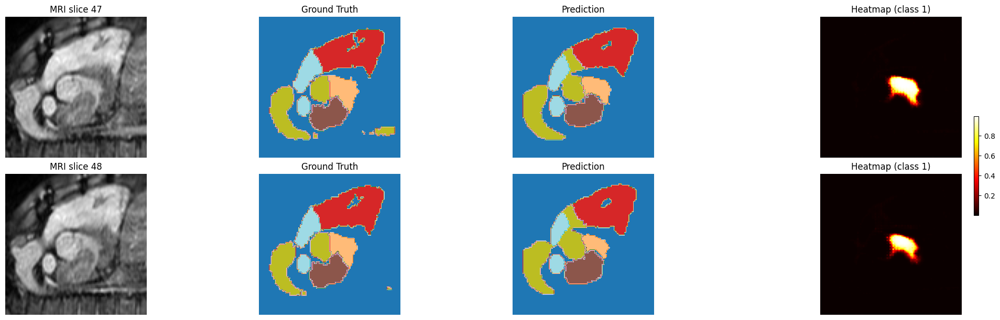

Mild Dice: 0.5973
Moderate Dice: 0.7984
Severe Dice: 0.6597
LR after scheduler step: 0.000500
----------
epoch 103/500
Current LR: 0.000500
epoch 103 average training loss: 0.3477
Epoch 103 Training Dice: 0.7947
----------
epoch 104/500
Current LR: 0.000500
epoch 104 average training loss: 0.3639
Epoch 104 Training Dice: 0.8114
Validation loss -> Mild: 0.5718, Moderate: 0.3775, Severe: 0.5463, Avg: 0.4985


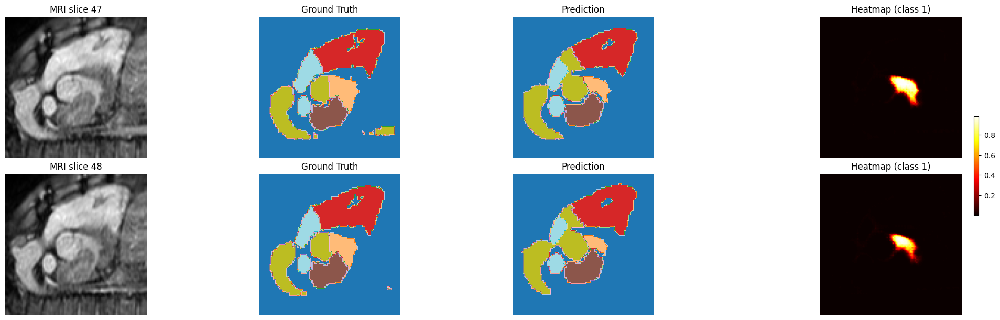

Mild Dice: 0.5844
Moderate Dice: 0.7790
Severe Dice: 0.6218
LR after scheduler step: 0.000500
----------
epoch 105/500
Current LR: 0.000500
epoch 105 average training loss: 0.3501
Epoch 105 Training Dice: 0.8156
----------
epoch 106/500
Current LR: 0.000500
epoch 106 average training loss: 0.3603
Epoch 106 Training Dice: 0.8191
Validation loss -> Mild: 0.5655, Moderate: 0.3537, Severe: 0.5107, Avg: 0.4766


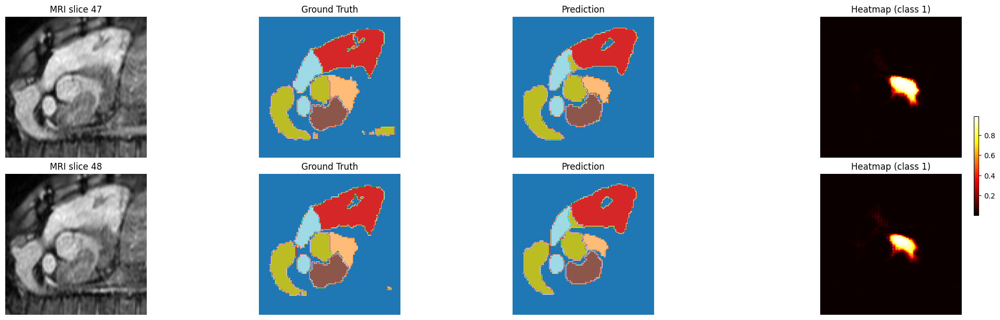

Mild Dice: 0.5896
Moderate Dice: 0.8030
Severe Dice: 0.6521
LR after scheduler step: 0.000500
----------
epoch 107/500
Current LR: 0.000500
epoch 107 average training loss: 0.3417
Epoch 107 Training Dice: 0.8111
----------
epoch 108/500
Current LR: 0.000500
epoch 108 average training loss: 0.3425
Epoch 108 Training Dice: 0.8165
Validation loss -> Mild: 0.5609, Moderate: 0.3540, Severe: 0.5162, Avg: 0.4770


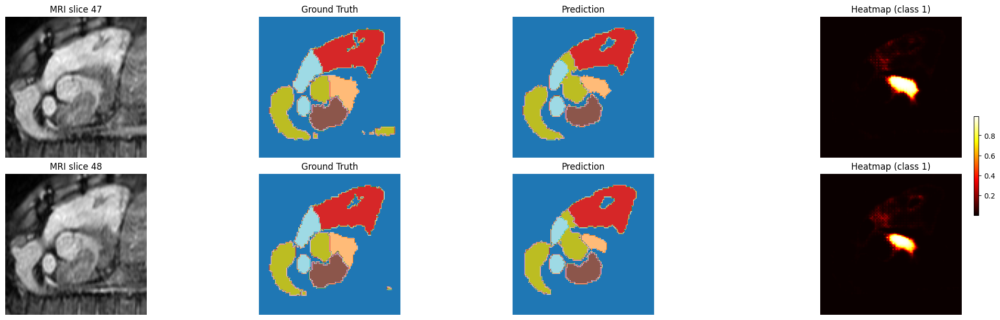

Mild Dice: 0.5956
Moderate Dice: 0.8022
Severe Dice: 0.6456
LR after scheduler step: 0.000500
----------
epoch 109/500
Current LR: 0.000500
epoch 109 average training loss: 0.3425
Epoch 109 Training Dice: 0.8330
----------
epoch 110/500
Current LR: 0.000500
epoch 110 average training loss: 0.3425
Epoch 110 Training Dice: 0.8308
Validation loss -> Mild: 0.5553, Moderate: 0.3420, Severe: 0.4955, Avg: 0.4643


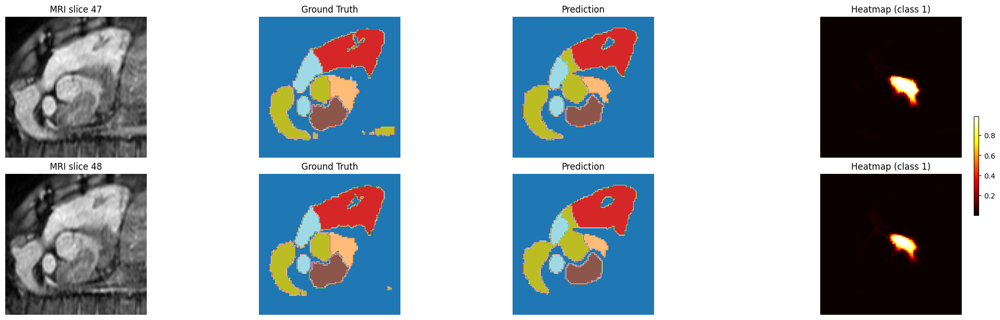

Mild Dice: 0.5998
Moderate Dice: 0.8145
Severe Dice: 0.6759
LR after scheduler step: 0.000500
----------
epoch 111/500
Current LR: 0.000500
epoch 111 average training loss: 0.3375
Epoch 111 Training Dice: 0.8284
----------
epoch 112/500
Current LR: 0.000500
epoch 112 average training loss: 0.3378
Epoch 112 Training Dice: 0.8118
Validation loss -> Mild: 0.5607, Moderate: 0.3712, Severe: 0.5331, Avg: 0.4883


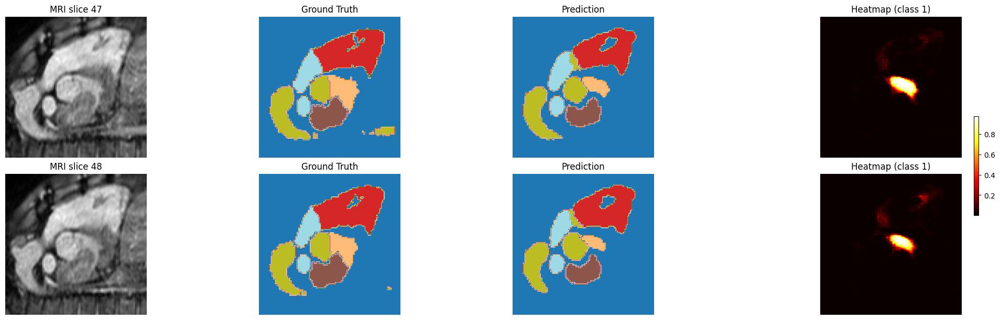

Mild Dice: 0.5957
Moderate Dice: 0.7804
Severe Dice: 0.6242
LR after scheduler step: 0.000500
----------
epoch 113/500
Current LR: 0.000500
epoch 113 average training loss: 0.3417
Epoch 113 Training Dice: 0.8250
----------
epoch 114/500
Current LR: 0.000500
epoch 114 average training loss: 0.3505
Epoch 114 Training Dice: 0.8192
Validation loss -> Mild: 0.5643, Moderate: 0.3534, Severe: 0.5089, Avg: 0.4755


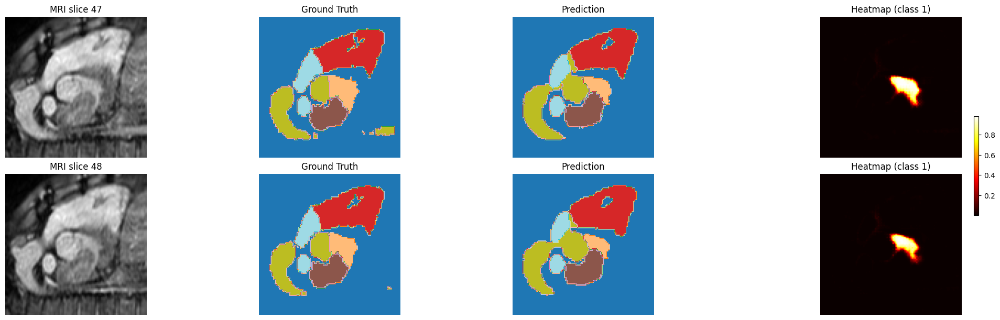

Mild Dice: 0.5883
Moderate Dice: 0.8025
Severe Dice: 0.6616
LR after scheduler step: 0.000500
----------
epoch 115/500
Current LR: 0.000500
epoch 115 average training loss: 0.3367
Epoch 115 Training Dice: 0.8247
----------
epoch 116/500
Current LR: 0.000500
epoch 116 average training loss: 0.3468
Epoch 116 Training Dice: 0.8185
Validation loss -> Mild: 0.5674, Moderate: 0.3533, Severe: 0.5079, Avg: 0.4762


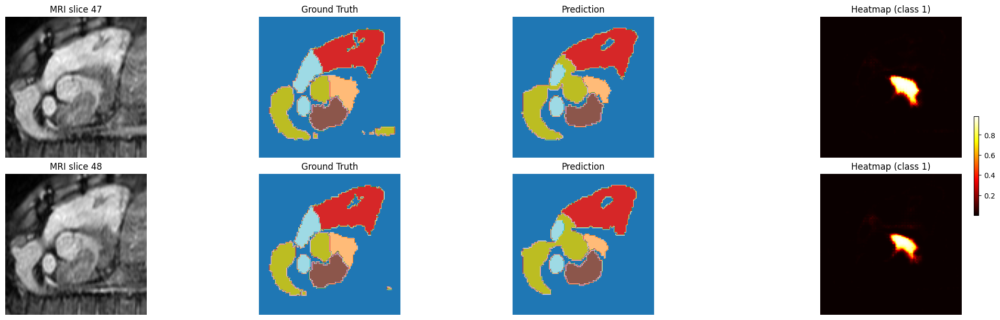

Mild Dice: 0.5867
Moderate Dice: 0.8012
Severe Dice: 0.6596
LR after scheduler step: 0.000500
----------
epoch 117/500
Current LR: 0.000500
epoch 117 average training loss: 0.3409
Epoch 117 Training Dice: 0.8095
----------
epoch 118/500
Current LR: 0.000500
epoch 118 average training loss: 0.3493
Epoch 118 Training Dice: 0.8178
Validation loss -> Mild: 0.5658, Moderate: 0.3591, Severe: 0.5102, Avg: 0.4784


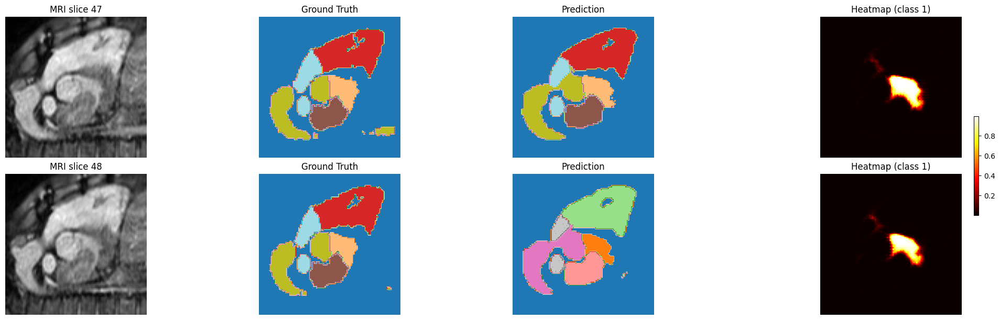

Mild Dice: 0.5842
Moderate Dice: 0.7984
Severe Dice: 0.6594
LR after scheduler step: 0.000500
----------
epoch 119/500
Current LR: 0.000500
epoch 119 average training loss: 0.3434
Epoch 119 Training Dice: 0.8206
----------
epoch 120/500
Current LR: 0.000500
epoch 120 average training loss: 0.3355
Epoch 120 Training Dice: 0.8149
Validation loss -> Mild: 0.5849, Moderate: 0.3596, Severe: 0.5351, Avg: 0.4932


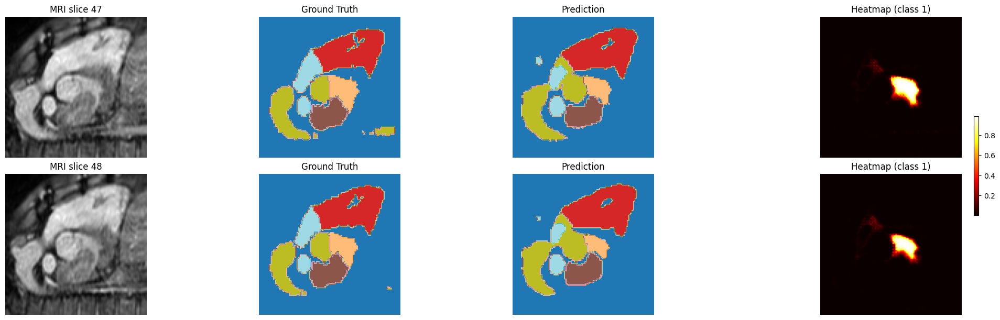

Mild Dice: 0.5702
Moderate Dice: 0.7977
Severe Dice: 0.6400
LR after scheduler step: 0.000500
----------
epoch 121/500
Current LR: 0.000500
epoch 121 average training loss: 0.3490
Epoch 121 Training Dice: 0.8013
----------
epoch 122/500
Current LR: 0.000500
epoch 122 average training loss: 0.3382
Epoch 122 Training Dice: 0.8343
Validation loss -> Mild: 0.5631, Moderate: 0.3461, Severe: 0.4864, Avg: 0.4652


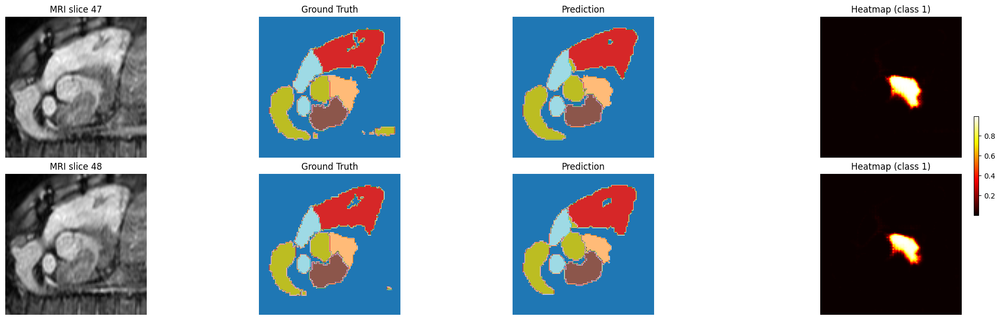

Mild Dice: 0.5925
Moderate Dice: 0.8097
Severe Dice: 0.6866
LR after scheduler step: 0.000500
----------
epoch 123/500
Current LR: 0.000500
epoch 123 average training loss: 0.3454
Epoch 123 Training Dice: 0.8131
----------
epoch 124/500
Current LR: 0.000500


KeyboardInterrupt: 

In [14]:
from monai.inferers import sliding_window_inference
from monai.transforms import Compose, EnsureType, Activations, AsDiscrete
from monai.losses import DiceCELoss
from monai.metrics import DiceMetric
from monai.networks.nets import UNet
from monai.networks.layers import Norm
import torch

# Model
device = torch.device("cuda:0")
model = UNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=9,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    num_res_units=2,
    norm=Norm.BATCH,
).to(device)

# Loss / optimizer / metric
loss_function = DiceCELoss(to_onehot_y=True, softmax=True, include_background=False, label_smoothing=0.1, 
                           lambda_dice=0.8,  # ↑ emphasis on Dice
                            lambda_ce=0.2)
optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)
dice_metric = DiceMetric(reduction="mean", num_classes=9, include_background=False)

# Scheduler: reduce LR on plateau (monitor validation loss)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",      # we want to minimize validation loss
    factor=0.9,      # LR = LR * 0.3
    patience=7,      # epochs without improvement before reducing
    min_lr=1e-6
)

# Hyperparameters
max_epochs = 500
val_interval = 2
best_metric = -1
best_metric_epoch = -1

train_loss_values = []        # training loss          
train_dice_values = []        # training dice
val_losses_mild = []
val_losses_moder = []
val_losses_sever = []  
mild_dice_f = []
moder_dice_f = []
sever_dice_f = []


# Post-processing
post_pred = Compose([EnsureType(), Activations(softmax=True)])
post_label = Compose([EnsureType()])

# Training loop
for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    print(f"Current LR: {optimizer.param_groups[0]['lr']:.6f}")  # <--- print LR
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data["image"].to(device), batch_data["label"].to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        labels = labels.long()
        loss = loss_function(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        #print(f"{step}/{len(train_ds) // train_loader.batch_size}, train_loss: {loss.item():.4f}")

    epoch_loss /= step
    train_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average training loss: {epoch_loss:.4f}")

    # --- Training Dice ---
    model.eval()
    dice_metric.reset()
    with torch.no_grad():
        for batch_data in train_loader:
            inputs, labels = batch_data["image"].to(device), batch_data["label"].to(device)
            outputs = model(inputs)
            if labels.ndim == 5:
                labels_squeezed = labels.squeeze(1).long()
            else:
                labels_squeezed = labels.long()
            preds = torch.argmax(outputs, dim=1).to(device)
            dice_metric(
                y_pred=F.one_hot(preds, num_classes=9).permute(0,4,1,2,3).float().to(device),
                y=F.one_hot(labels_squeezed, num_classes=9).permute(0,4,1,2,3).float().to(device)
            )
    train_dice = dice_metric.aggregate().item()
    dice_metric.reset()

    train_dice_values.append(train_dice)
    print(f"Epoch {epoch+1} Training Dice: {train_dice:.4f}")


    # Validation
    if (epoch + 1) % val_interval == 0:
        model.eval()
        

        with torch.no_grad():
            # Mild
            val_loss_mild, steps = 0, 0
            for val_data in mild_loader:
                val_inputs, val_labels = val_data["image"].to(device), val_data["label"].to(device)
                val_outputs = model(val_inputs)
                val_labels = val_labels.long()
                loss = loss_function(val_outputs, val_labels)
                val_loss_mild += loss.item()
                steps += 1
            val_loss_mild /= steps
            val_losses_mild.append(val_loss_mild)

            # Moderate
            val_loss_moder, steps = 0, 0
            for val_data in moder_loader:
                val_inputs, val_labels = val_data["image"].to(device), val_data["label"].to(device)
                val_outputs = model(val_inputs)
                val_labels = val_labels.long()
                loss = loss_function(val_outputs, val_labels)
                val_loss_moder += loss.item()
                steps += 1
            val_loss_moder /= steps
            val_losses_moder.append(val_loss_moder)

            # Severe
            val_loss_sever, steps = 0, 0
            for val_data in sever_loader:
                val_inputs, val_labels = val_data["image"].to(device), val_data["label"].to(device)
                val_outputs = model(val_inputs)
                val_labels = val_labels.long()
                loss = loss_function(val_outputs, val_labels)
                val_loss_sever += loss.item()
                steps += 1
            val_loss_sever /= steps
            val_losses_sever.append(val_loss_sever)

        # Average across the three groups
        val_loss = (val_loss_mild+val_loss_moder+val_loss_sever)/3
        print(f"Validation loss -> Mild: {val_loss_mild:.4f}, Moderate: {val_loss_moder:.4f}, Severe: {val_loss_sever:.4f}, Avg: {val_loss:.4f}")

        # Step scheduler with the averaged validation loss
        scheduler.step(val_loss)

        # Severity-specific dice
        mild_dice = evaluate_model(model, mild_loader, visualize=True)
        moderate_dice = evaluate_model(model, moder_loader, visualize=False)
        severe_dice = evaluate_model(model, sever_loader, visualize=False)
        mild_dice_f.append(mild_dice)
        moder_dice_f.append(moderate_dice)
        sever_dice_f.append(severe_dice)

        print(f"Mild Dice: {mild_dice:.4f}")
        print(f"Moderate Dice: {moderate_dice:.4f}")
        print(f"Severe Dice: {severe_dice:.4f}")
        print(f"LR after scheduler step: {optimizer.param_groups[0]['lr']:.6f}")


In [23]:
torch.save({
    'epoch': epoch + 1,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'scheduler_state_dict': scheduler.state_dict(),
    'best_metric': best_metric,
    'best_metric_epoch': best_metric_epoch,
}, "/kaggle/working/model/latest_model_f.pth")


RuntimeError: Parent directory /kaggle/working/model does not exist.

In [24]:
import os

for root, dirs, files in os.walk("/kaggle/working"):
    for f in files:
        print(os.path.join(root, f))


/kaggle/working/latest_model_f.pth
/kaggle/working/latest_model.pth


In [26]:
import shutil
shutil.make_archive("/kaggle/working/best_model", 'zip', "/kaggle/working", "latest_model.pth")
print("✅ Zipped model — now download best_model.zip from the Output tab.")


✅ Zipped model — now download best_model.zip from the Output tab.


In [ ]:
import pandas as pd

results = pd.DataFrame({
    "epoch": list(range(1, len(train_loss_values) + 1)),
    "train_loss": train_loss_values,
    "val_loss_mild": val_loss_values,
    "train_dice": train_dice_values,
    "val_dice": val_dice_values
})


In [ ]:
for batch_data in train_loader:
    inputs, labels = batch_data["image"].to(device), batch_data["label"].to(device)
    print(inputs.shape, labels.shape)

In [ ]:
for val_data in test_loader:
    val_inputs, val_labels = val_data["image"].to(device), val_data["label"].to(device),
    print(val_inputs.shape, val_labels.shape)

In [ ]:
from monai.losses import DiceLoss
from monai.metrics import DiceMetric
from monai.networks.nets import UNet
from monai.networks.layers import Norm

device = torch.device("cuda:0")
model = UNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=9,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    num_res_units=2,
    norm=Norm.BATCH,
).to(device)
loss_function = DiceLoss(to_onehot_y=True, softmax=True)
optimizer = torch.optim.Adam(model.parameters(), 1e-4)
dice_metric = DiceMetric(include_background=False, reduction="mean")

max_epochs = 2000

for epoch in range(max_epochs):
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data["image"].to(device), batch_data["label"].to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        labels=labels.long()
        loss = loss_function(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    if(epoch%10==0):
        evaluate_model(model)
    print(f"Epoch {epoch + 1}/{max_epochs}, Loss: {epoch_loss / step:.4f}")


In [ ]:
evaluate_model(model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assume you have your model and device setup
model.eval()

with torch.no_grad():
    # Get one batch from the loader
    batch = next(iter(train_loader))
    images = batch["image"].to(device)
    labels = batch["label"].to(device)

    # Predict
    outputs = model(images)  # outputs shape e.g. (B, C, D, H, W)

    # For segmentation, typically do argmax over channel dim
    preds = torch.argmax(outputs, dim=1)  # shape (B, D, H, W)

# Move preds and labels to cpu and numpy for plotting
preds_np = preds[0].cpu().numpy()
labels_np = labels[0].cpu().numpy()
image_np = images[0].cpu().numpy()[0]

fig, axes = plt.subplots(3, 4, figsize=(12, 9))

slice_indices = np.linspace(0, preds_np.shape[0] - 1, 12, dtype=int)

for i, idx in enumerate(slice_indices):
    ax = axes.flat[i]
    ax.imshow(image_np[idx], cmap="gray")
    ax.imshow(preds_np[idx], alpha=0.5, cmap="jet")  # overlay prediction mask
    ax.set_title(f"Slice {idx}")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
model.eval()

# --- Inference and visualization ---

with torch.no_grad():
    batch = next(iter(train_loader))
    images = batch["image"].to(device)     # (B, C, D, H, W)
    labels = batch["label"].to(device)     # (B, C, D, H, W) or sometimes (B, D, H, W)

    outputs = model(images)                 # (B, 2, D, H, W)
    preds = torch.argmax(outputs, dim=1)   # (B, D, H, W)

# Convert tensors to numpy for plotting
image_np = images[0].cpu().numpy()
labels_np = labels[0].cpu().numpy()
preds_np = preds[0].cpu().numpy()

# Squeeze channel if present in labels and images
if image_np.ndim == 4:
    image_np = image_np[0]
if labels_np.ndim == 4:
    labels_np = np.squeeze(labels_np)

print("Image shape:", image_np.shape)
print("Label shape:", labels_np.shape)
print("Prediction shape:", preds_np.shape)

# Visualize a few slices (axial)
slice_indices = [30, 50, 70]

fig, axes = plt.subplots(len(slice_indices), 3, figsize=(12, 8))

for i, idx in enumerate(slice_indices):
    # Original image slice
    axes[i, 0].imshow(image_np[idx], cmap="gray")
    axes[i, 0].set_title(f"Image Slice {idx}")
    axes[i, 0].axis("off")

    # Ground truth overlay
    axes[i, 1].imshow(image_np[idx], cmap="gray")
    axes[i, 1].imshow(labels_np[idx], alpha=0.5, cmap="jet")
    axes[i, 1].set_title("Ground Truth")
    axes[i, 1].axis("off")
 # Prediction overlay
    axes[i, 2].imshow(image_np[idx], cmap="gray")
    axes[i, 2].imshow(preds_np[idx], alpha=0.5, cmap="jet")
    axes[i, 2].set_title("Prediction")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
model.eval()

# --- Inference and visualization ---

with torch.no_grad():
    batch = next(iter(test_loader))
    images = batch["image"].to(device)     # (B, C, D, H, W)
    labels = batch["label"].to(device)     # (B, C, D, H, W) or sometimes (B, D, H, W)

    outputs = model(images)                 # (B, 2, D, H, W)
    preds = torch.argmax(outputs, dim=1)   # (B, D, H, W)

# Convert tensors to numpy for plotting
image_np = images[0].cpu().numpy()
labels_np = labels[0].cpu().numpy()
preds_np = preds[0].cpu().numpy()

# Squeeze channel if present in labels and images
if image_np.ndim == 4:
    image_np = image_np[0]
if labels_np.ndim == 4:
    labels_np = np.squeeze(labels_np)

print("Image shape:", image_np.shape)
print("Label shape:", labels_np.shape)
print("Prediction shape:", preds_np.shape)

# Visualize a few slices (axial)
slice_indices = [45,60,80]

fig, axes = plt.subplots(len(slice_indices), 3, figsize=(12, 8))

for i, idx in enumerate(slice_indices):
    # Original image slice
    axes[i, 0].imshow(image_np[idx], cmap="gray")
    axes[i, 0].set_title(f"Image Slice {idx}")
    axes[i, 0].axis("off")

    # Ground truth overlay
    axes[i, 1].imshow(image_np[idx], cmap="gray")
    axes[i, 1].imshow(labels_np[idx], alpha=0.5, cmap="jet")
    axes[i, 1].set_title("Ground Truth")
    axes[i, 1].axis("off")
 # Prediction overlay
    axes[i, 2].imshow(image_np[idx], cmap="gray")
    axes[i, 2].imshow(preds_np[idx], alpha=0.5, cmap="jet")
    axes[i, 2].set_title("Prediction")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import torch
import torch.nn.functional as F

def multiclass_dice(preds, labels, num_classes, smooth=1e-5):
    preds = preds.long()
    labels = labels.long()

    preds_onehot = F.one_hot(preds, num_classes=num_classes).permute(0,4,1,2,3).float()
    labels_onehot = F.one_hot(labels, num_classes=num_classes).permute(0,4,1,2,3).float()

    intersection = (preds_onehot * labels_onehot).sum(dim=(2,3,4))
    union = preds_onehot.sum(dim=(2,3,4)) + labels_onehot.sum(dim=(2,3,4))
    dice = (2 * intersection + smooth) / (union + smooth)

    return dice.mean()

# -----------------------------
# Evaluation Loop
# -----------------------------
model.eval()
dice_scores = []

with torch.no_grad():
    for batch_data in test_loader:
        images = batch_data["image"].to(device)
        labels = batch_data["label"].to(device)

        outputs = model(images)               # (B, C, D, H, W)
        preds = torch.argmax(outputs, dim=1)  # (B, D, H, W)

        if labels.ndim == 5:
            labels = labels.squeeze(1)

        dice = dice_metric(preds, labels)
        dice_scores.append(dice.item())

avg_dice = sum(dice_scores) / len(dice_scores)
print(dice_scores)
print(f"Average Dice Score on test set: {avg_dice:.4f}")


In [ ]:
from monai.metrics import DiceMetric

dice_metric = DiceMetric(include_background=False, reduction="mean", num_classes=9)

model.eval()
with torch.no_grad():
    for batch_data in test_loader:
        images = batch_data["image"].to(device)
        labels = batch_data["label"].to(device)

        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        if labels.ndim == 5:
            labels = labels.squeeze(1).long()

        dice_metric(y_pred=F.one_hot(preds, num_classes=9).permute(0,4,1,2,3),
                    y=F.one_hot(labels, num_classes=9).permute(0,4,1,2,3))

# After the loop:
final_dice = dice_metric.aggregate().item()
print(f"Average Dice Score on test set: {final_dice:.4f}")
dice_metric.reset()
